# Tratamiento de imágenes  2023 - Entregable 1
# Fecha de entrega: 12/04/2023

**Importante:** En todos los ejercicios se espera que se entregue comentarios sobre decisiones tomadas en la implementación así como un análisis de los resultados. Estos comentarios y análisis se pueden entregar en celdas de texto agregadas a los notebooks o en un informe aparte.

Para la entrega se sube un **zip** (no rar, ni otro formato) con:
* El notebook del entregable modificado. El notebook debe tener las celdas ejecutadas con las salidas correspondientes. Debe tener todo lo necesario para poder ser ejecutado nuevamente
* Todo el resto del contenido del zip del entregable. Si, para mostrar resultados, usan en el notebook imágenes propias, deben incluirlas en la carpeta **imagenes**  del zip. 
* El informe en pdf en caso de no incluir las discusiones dentro del notebook en celdas "Markdown", o si les resulta más sencillo realizar el análisis en un documento aparte.

No se deben incluir en el zip de la entrega las imágenes de prueba que están disponibles en la página web del curso. Se asumirá que esas imágenes están en un directorio y se hará referencia a dichas imágenes en forma relativa a ese directorio (ver la celda siguiente).
   

In [1]:
import os
import numpy as np
from matplotlib import pyplot as plt
from skimage.io import imread, imsave

# FORMAS DE VER LAS GRAFICAS --------------------
# ELEGIR UNA DE LAS OPCIONES Y DES-COMENTAR (sacar # de la linea)
# ----------------
# a) graficas en línea  entre las celdas (no interactivo)
%matplotlib inline
# ---------------- 
# b) graficas en línea  entre las celdas (interactivo)
# %matplotlib notebook
# ----------------
# c) graficas en ventanas externas (abre una ventana por cada figura)
# %matplotlib
# ----------------
# d) Si se usa "jupyter lab" en lugar de "jupyter notebook" usar %matplotlib widget en lugar de %matplotlib notebook 
# requiere instalar el modulo "ipympl". Ver https://stackoverflow.com/questions/51922480/javascript-error-ipython-is-not-defined-in-jupyterlab#56416229
#%matplotlib widget
#---------------------------------------------------



# Directorio con la base de imágenes de prueba (las que están en la web de Timag)
# Ej. si usan la imagen trapo.jpg en el notebook no tienen que subirla al eva
# La llaman en el notebook en forma relativa a donde tengan esas imagenes:
# 
# filename = os.path.join(dir_base_imagenes, 'trapo.jpg')
# I = imread(filename)
dir_base_imagenes = 'base_imagenes/'

## 1) Líneas de nivel

Escribir un programa que reciba una imagen y un conjunto de valores y muestre las líneas de nivel correspondientes a dichos valores. Para ello implementar el algoritmo marching squares (Ver por ejemplo: https://en.wikipedia.org/wiki/Marching_squares).

Aplicarlo a imágenes naturales y artificiales y comparar los resultados con los de la función contour (https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.contour.html). 

Imágenes artificiales sugeridas: cono.png, pliegues.png, oclusion.png


In [2]:
   
def lineas_nivel(img, levels):
    """
    Genera líneas de nivel de una imagen dada. 
    Muestra las líneas de nivel sobre la figura que se encuentre activa 

    Args:
        img (array 2D): Imagen de entrada.
        levels (list): Lista de niveles.

    Returns:
        None
    """
    
    # IMPLEMENTAR
    # Set random seed for random color plotting
    np.random.seed(12345)
    # Iterate over each threshold
    for level in levels:
        # Initialize the contour lines
        contour_lines = []
        # Iterate over each square in the image
        for i in range(img.shape[0]-1):
            for j in range(img.shape[1]-1):
                # Get the four corner values of the square
                corners = np.array([
                    img[i, j],
                    img[i+1, j],
                    img[i+1, j+1],
                    img[i, j+1]
                ])

                # Get the edge intersection position
                case_bin = corners > level
                case_dec = np.dot(np.array([8,1,2,4]),case_bin)
                if corners[0]<=corners[1]:
                    a=np.interp(level, [corners[0], corners[1]], [0, 1])
                else: a=1-np.interp(level, [corners[1], corners[0]], [0, 1])
                if corners[1]<=corners[2]:
                    b=np.interp(level, [corners[1], corners[2]], [0, 1])
                else: b=1-np.interp(level, [corners[2], corners[1]], [0, 1])
                if corners[3]<=corners[2]:
                    c=np.interp(level, [corners[3], corners[2]], [0, 1])
                else: c=1-np.interp(level, [corners[2], corners[3]], [0, 1])
                if corners[0]<=corners[3]:
                    d=np.interp(level, [corners[0], corners[3]], [0, 1])
                else: d=1-np.interp(level, [corners[3], corners[0]], [0, 1])
                # Decide which case corresponds
                if case_dec==1 or case_dec==14:
                    contour_lines.append([[j,i+a],[j+b,i+1]])
                elif case_dec==2 or case_dec==13:
                    contour_lines.append([[j+b,i+1],[j+1,i+c]])
                elif case_dec==3 or case_dec==12:
                    contour_lines.append([[j,i+a],[j+1,i+c]])
                elif case_dec==4 or case_dec==11:
                    contour_lines.append([[j+d,i],[j+1,i+c]])
                elif case_dec==5:
                    contour_lines.append([[j,i+a],[j+d,i]])
                    contour_lines.append([[j+b,i+1],[j+1,i+c]])
                elif case_dec==6 or case_dec==9:
                    contour_lines.append([[j+d,i],[j+b,i+1]])
                elif case_dec==7 or case_dec==8:
                    contour_lines.append([[j,i+a],[j+d,i]])
                elif case_dec==10:
                    contour_lines.append([[j,i+a],[j+b,i+1]])
                    contour_lines.append([[j+d,i],[j+1,i+c]])                                                              
        contour_lines_arr=np.array(contour_lines)
        # plot contour lines for this level on top of active figure
        color_tup=(np.random.rand(),np.random.rand(),np.random.rand())
        for line in contour_lines_arr:
            plt.plot(line[:,0], line[:,1], color=color_tup)
   

Text(0.5, 0.85, 'Lineas de nivel 100 y 200 sobre imagen vacía')

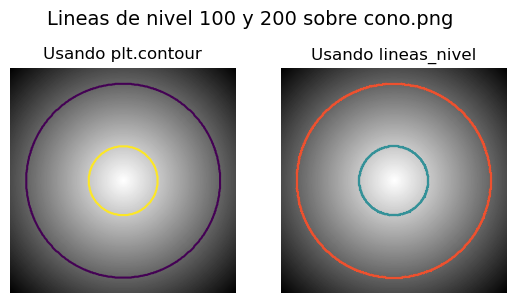

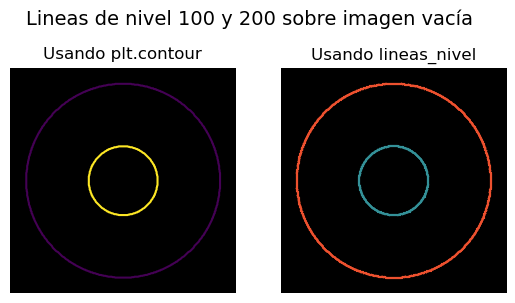

In [3]:
# Ejemplo de prueba: lineas_nivel y plt.contour deberían ser intercambiables

I = imread('imagenes/cono.png')
if I.ndim>2:
    I = I[:,:,0]


# muestra las líneas de nivel 100 y 200 sobre la imagen seleccionada
fig, ax=plt.subplots(1,2)
ax[0].imshow(I, cmap='gray')
ax[0].contour(I, levels=[100, 200])
ax[0].set_title('Usando plt.contour')
ax[0].axis('Off')
ax[1].imshow(I, cmap='gray')
lineas_nivel(I, levels=[100,200])
ax[1].set_title('Usando lineas_nivel')
ax[1].axis('Off')
fig.suptitle('Lineas de nivel 100 y 200 sobre cono.png', y=0.85, fontsize=14)

# muestra las líneas de nivel 100 y 200 sobre una imagen vacía
fig, ax=plt.subplots(1,2)
ax[0].imshow(np.zeros_like(I), cmap='gray')
ax[0].contour(I, levels=[100,200])
ax[0].set_title('Usando plt.contour')
ax[0].axis('Off')
ax[1].imshow(np.zeros_like(I), cmap='gray')
lineas_nivel(I, levels=[100, 200])
ax[1].set_title('Usando lineas_nivel')
ax[1].axis('Off')
fig.suptitle('Lineas de nivel 100 y 200 sobre imagen vacía', y=0.85, fontsize=14)




Text(0.5, 0.85, 'Lineas de nivel 100 y 200 sobre imagen vacía')

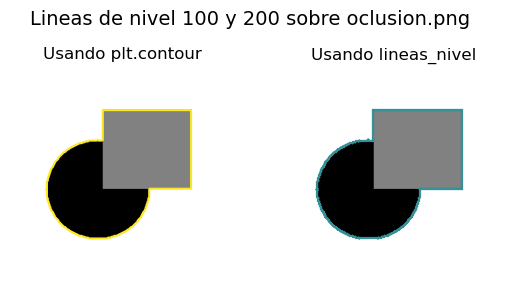

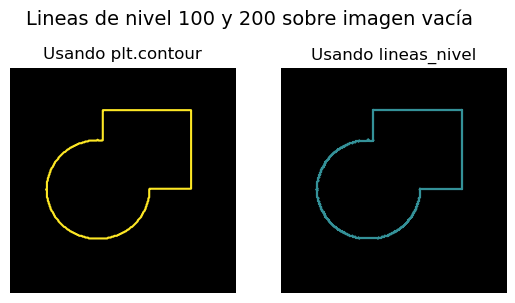

In [4]:
I = imread('imagenes/oclusion.bmp')
if I.ndim>2:
    I = I[:,:,0]


# muestra las líneas de nivel 100 y 200 sobre la imagen seleccionada
fig, ax=plt.subplots(1,2)
ax[0].imshow(I, cmap='gray')
ax[0].contour(I, levels=[100, 200])
ax[0].set_title('Usando plt.contour')
ax[0].axis('Off')
ax[1].imshow(I, cmap='gray')
lineas_nivel(I, levels=[100,200])
ax[1].set_title('Usando lineas_nivel')
ax[1].axis('Off')
fig.suptitle('Lineas de nivel 100 y 200 sobre oclusion.png', y=0.85, fontsize=14)

# muestra las líneas de nivel 100 y 200 sobre una imagen vacía
fig, ax=plt.subplots(1,2)
ax[0].imshow(np.zeros_like(I), cmap='gray')
ax[0].contour(I, levels=[100,200])
ax[0].set_title('Usando plt.contour')
ax[0].axis('Off')
ax[1].imshow(np.zeros_like(I), cmap='gray')
lineas_nivel(I, levels=[100, 200])
ax[1].set_title('Usando lineas_nivel')
ax[1].axis('Off')
fig.suptitle('Lineas de nivel 100 y 200 sobre imagen vacía', y=0.85, fontsize=14)




Text(0.5, 1, 'Lineas de nivel 100 y 200 sobre imagen vacía')

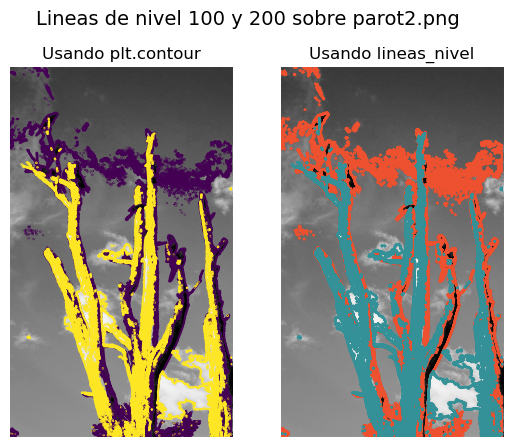

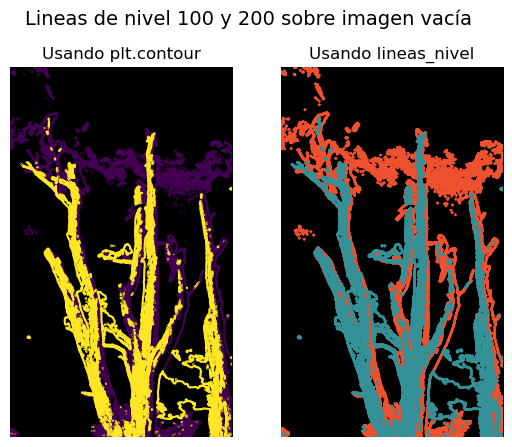

In [5]:
I = imread('imagenes/parot2.png')
if I.ndim>2:
    I = I[:,:,0]


# muestra las líneas de nivel 100 y 200 sobre la imagen seleccionada
fig, ax=plt.subplots(1,2)
ax[0].imshow(I, cmap='gray')
ax[0].contour(I, levels=[100, 200])
ax[0].set_title('Usando plt.contour')
ax[0].axis('Off')
ax[1].imshow(I, cmap='gray')
lineas_nivel(I, levels=[100,200])
ax[1].set_title('Usando lineas_nivel')
ax[1].axis('Off')
fig.suptitle('Lineas de nivel 100 y 200 sobre parot2.png', y=1, fontsize=14)

# muestra las líneas de nivel 100 y 200 sobre una imagen vacía
fig, ax=plt.subplots(1,2)
ax[0].imshow(np.zeros_like(I), cmap='gray')
ax[0].contour(I, levels=[100,200])
ax[0].set_title('Usando plt.contour')
ax[0].axis('Off')
ax[1].imshow(np.zeros_like(I), cmap='gray')
lineas_nivel(I, levels=[100, 200])
ax[1].set_title('Usando lineas_nivel')
ax[1].axis('Off')
fig.suptitle('Lineas de nivel 100 y 200 sobre imagen vacía', y=1, fontsize=14)




Se obtiene el mismo resultado utilizando la función 'plt.contour' y 'lineas_nivel' para todas las imagenes.

## 2) Histograma

Imágenes sugeridas: parot1.png, parot2.png, strike1.png, strike2.png

**a)** Implementar una función que calcule el histograma e histograma acumulado de una imagen. Mostrar resultados para las imágenes parot1.png y parot2.png con diverso número de bins (bins=10, bins=100, bins=256). 

In [6]:
def histograma(img, bins, rango=None):    
    """
    Calcula el histograma de una imagen. 
    Devuelve el histograma y los bins correspondientes.
    
    Args:
        imagen (ndarray): La imagen de entrada.
        bins (int): El número de bins a utilizar.
        range (float, float), opcional. Rango mínimo y máximo para los bins. Si no 
                                        se pasa, se toma el mínimo y máximo de la imagen   

    Returns:
        counts (1D-array de largo bins): Cantidad de muestras en cada bin
        bin_edges (1D-array de largo bins +1): Los bordes de los bins utilizados para calcular el histograma.
    """
    
     # IMPLEMENTAR
    counts = np.zeros(bins)
    if rango==None:
        bin_edges=np.array([np.min(img)+i*(np.max(img)-np.min(img))/bins for i in range(bins+1)])
    else: bin_edges=np.array([rango[0]+i*(rango[1]-rango[0])/bins for i in range(bins+1)])
    for i in range(len(bin_edges)-2):
        counts[i]= np.sum(np.logical_and(img>=bin_edges[i],img<bin_edges[i+1]))
    #En el último incluyo todos los pixeles restantes para incluir los que son iguales al rango máximo
    counts[-1]=len(img.flatten())-np.sum(counts)
    return counts, bin_edges

def histogramaAcumulado(img, bins, rango=None):
    """
    Calcula el histograma acumulado de una imagen. 
    Devuelve el histograma acumulado y los bins correspondientes.

    Args:
        imagen (ndarray): La imagen de entrada.
        bins (int): El número de bins a utilizar.
        range (float, float), opcional. Rango mínimo y máximo para los bins. Si no 
                                        se pasa, se toma el mínimo y máximo de la imagen

    Returns:
        counts (1D-array de largo bins): Cantidad de muestras acumuladas en cada bin
        bin_edges (1D-array de largo bins +1): Los bordes de los bins utilizados.
    """
    
     # IMPLEMENTAR
    counts_hist, bin_edges=histograma(img, bins, rango)
    counts=np.cumsum(counts_hist)
    return counts, bin_edges

Text(0.5, 1.0, 'Histograma acumulado parot1, bins=256')

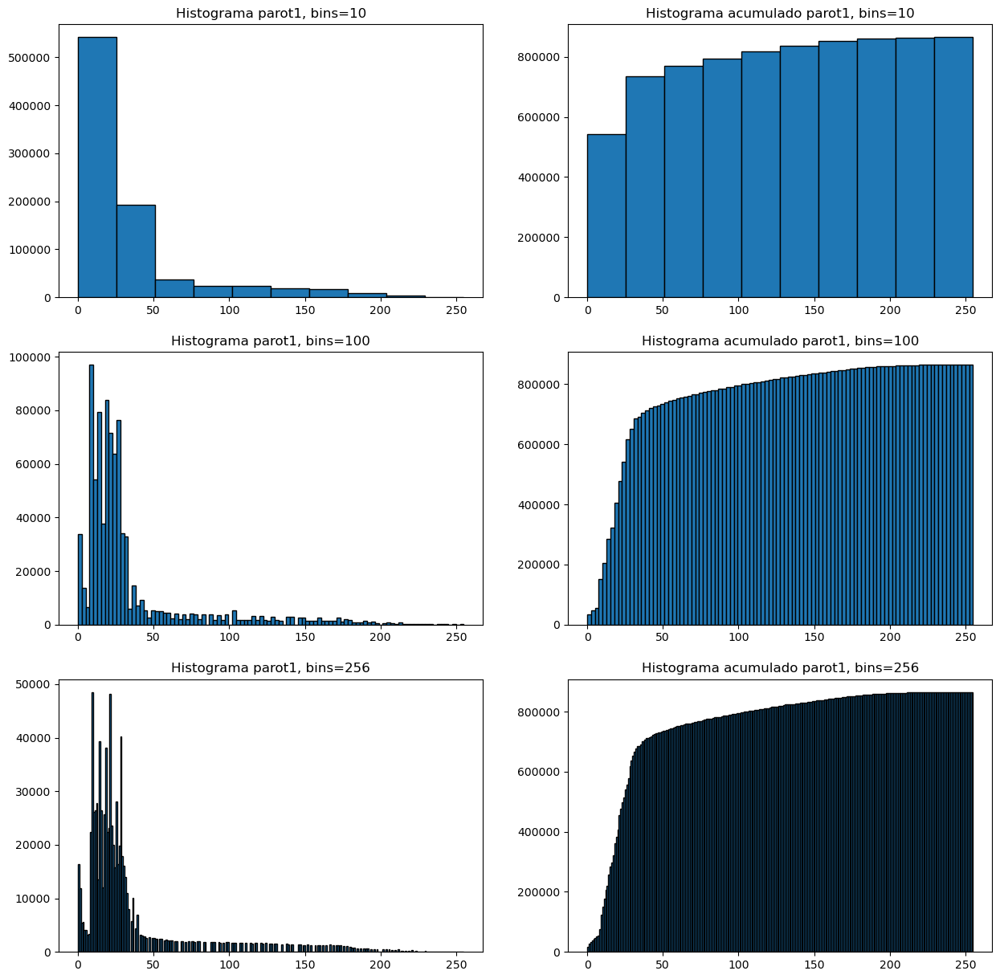

In [7]:
parot1=imread('imagenes/parot1.png')
counts_parot1_10, bin_edges_parot1_10= histograma(parot1, 10)
counts_parot1_100, bin_edges_parot1_100= histograma(parot1, 100)
counts_parot1_256, bin_edges_parot1_256= histograma(parot1, 256)

counts_parot1_10_ac, bin_edges_parot1_10_ac= histogramaAcumulado(parot1, 10)
counts_parot1_100_ac, bin_edges_parot1_100_ac= histogramaAcumulado(parot1, 100)
counts_parot1_256_ac, bin_edges_parot1_256_ac= histogramaAcumulado(parot1, 256)



fig, ax= plt.subplots(3,2, figsize=(15,15))
ax[0,0].bar(bin_edges_parot1_10[:-1], counts_parot1_10, width=np.diff(bin_edges_parot1_10), edgecolor="black", align="edge")
ax[1,0].bar(bin_edges_parot1_100[:-1], counts_parot1_100, width=np.diff(bin_edges_parot1_100), edgecolor="black", align="edge")
ax[2,0].bar(bin_edges_parot1_256[:-1], counts_parot1_256, width=np.diff(bin_edges_parot1_256), edgecolor="black", align="edge")
ax[0,1].bar(bin_edges_parot1_10_ac[:-1], counts_parot1_10_ac, width=np.diff(bin_edges_parot1_10_ac), edgecolor="black", align="edge")
ax[1,1].bar(bin_edges_parot1_100_ac[:-1], counts_parot1_100_ac, width=np.diff(bin_edges_parot1_100_ac), edgecolor="black", align="edge")
ax[2,1].bar(bin_edges_parot1_256_ac[:-1], counts_parot1_256_ac, width=np.diff(bin_edges_parot1_256_ac), edgecolor="black", align="edge")

ax[0,0].set_title('Histograma parot1, bins=10')
ax[1,0].set_title('Histograma parot1, bins=100')
ax[2,0].set_title('Histograma parot1, bins=256')
ax[0,1].set_title('Histograma acumulado parot1, bins=10')
ax[1,1].set_title('Histograma acumulado parot1, bins=100')
ax[2,1].set_title('Histograma acumulado parot1, bins=256')

Text(0.5, 1.0, 'Histograma acumulado parot2, bins=256')

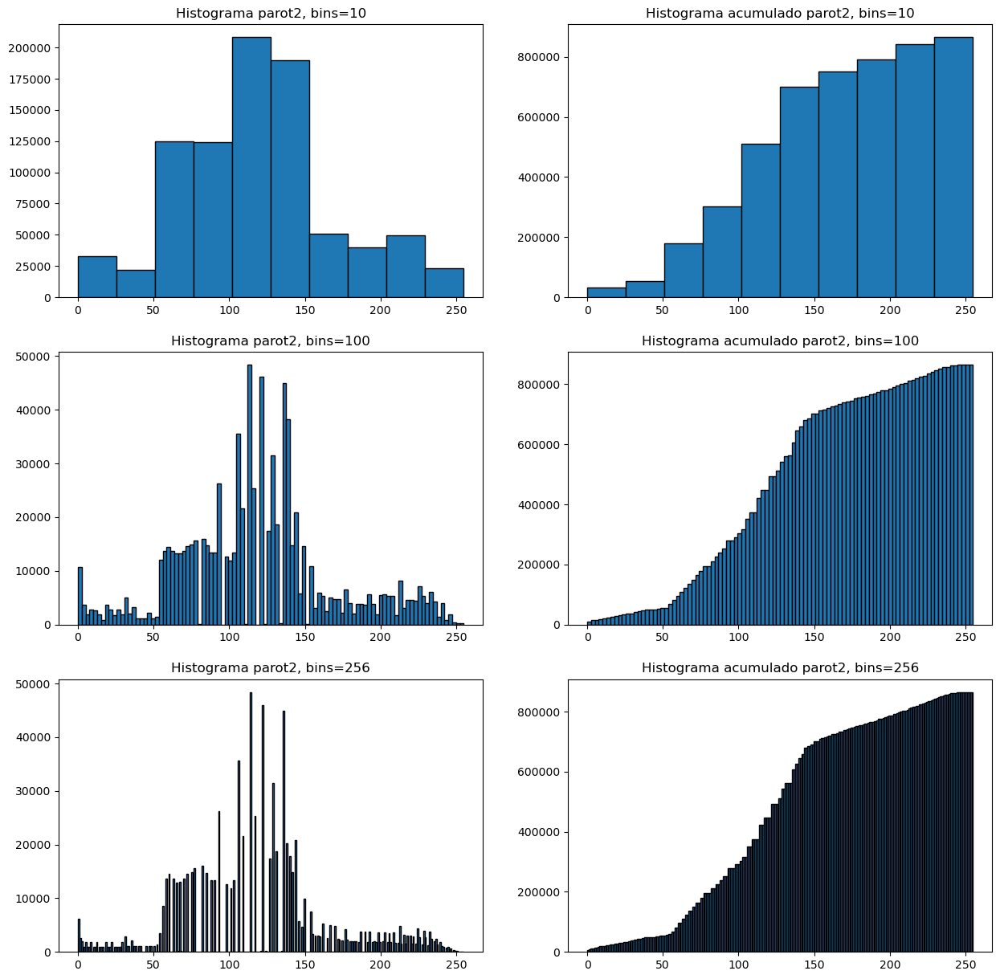

In [8]:
parot2=imread('imagenes/parot2.png')
counts_parot2_10, bin_edges_parot2_10= histograma(parot2, 10)
counts_parot2_100, bin_edges_parot2_100= histograma(parot2, 100)
counts_parot2_256, bin_edges_parot2_256= histograma(parot2, 256)

counts_parot2_10_ac, bin_edges_parot2_10_ac= histogramaAcumulado(parot2, 10)
counts_parot2_100_ac, bin_edges_parot2_100_ac= histogramaAcumulado(parot2, 100)
counts_parot2_256_ac, bin_edges_parot2_256_ac= histogramaAcumulado(parot2, 256)



fig, ax= plt.subplots(3,2, figsize=(15,15))
ax[0,0].bar(bin_edges_parot2_10[:-1], counts_parot2_10, width=np.diff(bin_edges_parot2_10), edgecolor="black", align="edge")
ax[1,0].bar(bin_edges_parot2_100[:-1], counts_parot2_100, width=np.diff(bin_edges_parot2_100), edgecolor="black", align="edge")
ax[2,0].bar(bin_edges_parot2_256[:-1], counts_parot2_256, width=np.diff(bin_edges_parot2_256), edgecolor="black", align="edge")
ax[0,1].bar(bin_edges_parot2_10_ac[:-1], counts_parot2_10_ac, width=np.diff(bin_edges_parot2_10_ac), edgecolor="black", align="edge")
ax[1,1].bar(bin_edges_parot2_100_ac[:-1], counts_parot2_100_ac, width=np.diff(bin_edges_parot2_100_ac), edgecolor="black", align="edge")
ax[2,1].bar(bin_edges_parot2_256_ac[:-1], counts_parot2_256_ac, width=np.diff(bin_edges_parot2_256_ac), edgecolor="black", align="edge")

ax[0,0].set_title('Histograma parot2, bins=10')
ax[1,0].set_title('Histograma parot2, bins=100')
ax[2,0].set_title('Histograma parot2, bins=256')
ax[0,1].set_title('Histograma acumulado parot2, bins=10')
ax[1,1].set_title('Histograma acumulado parot2, bins=100')
ax[2,1].set_title('Histograma acumulado parot2, bins=256')

**b)** Comparar los histogramas con la salida de la función *histogram()* de numpy para las mismas imágenes y mismos bins.

Text(0.5, 1.0, 'Histograma parot1, bins=256, usando np.histogram')

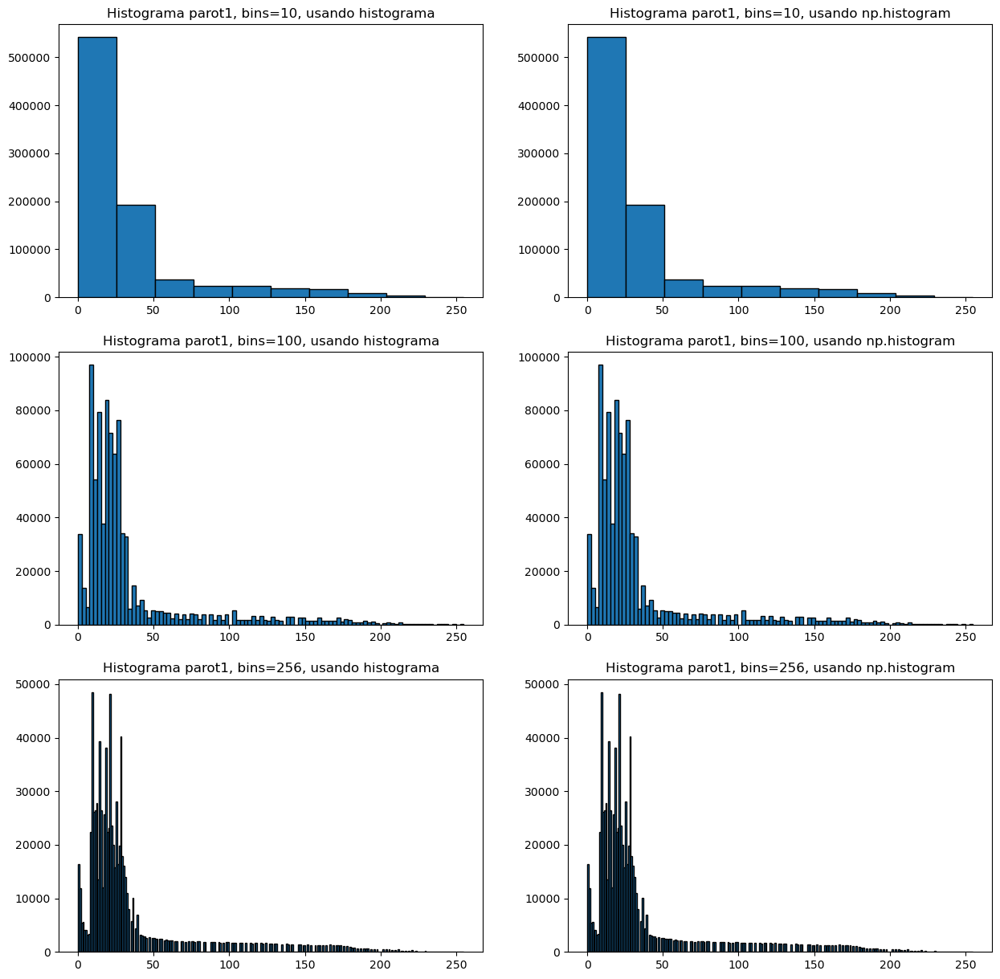

In [9]:
counts_parot1_10_np, bin_edges_parot1_10_np= np.histogram(parot1, 10)
counts_parot1_100_np, bin_edges_parot1_100_np= np.histogram(parot1, 100)
counts_parot1_256_np, bin_edges_parot1_256_np= np.histogram(parot1, 256)



fig, ax= plt.subplots(3,2, figsize=(15,15))
ax[0,0].bar(bin_edges_parot1_10[:-1], counts_parot1_10, width=np.diff(bin_edges_parot1_10), edgecolor="black", align="edge")
ax[1,0].bar(bin_edges_parot1_100[:-1], counts_parot1_100, width=np.diff(bin_edges_parot1_100), edgecolor="black", align="edge")
ax[2,0].bar(bin_edges_parot1_256[:-1], counts_parot1_256, width=np.diff(bin_edges_parot1_256), edgecolor="black", align="edge")
ax[0,1].bar(bin_edges_parot1_10_np[:-1], counts_parot1_10_np, width=np.diff(bin_edges_parot1_10_np), edgecolor="black", align="edge")
ax[1,1].bar(bin_edges_parot1_100_np[:-1], counts_parot1_100_np, width=np.diff(bin_edges_parot1_100_np), edgecolor="black", align="edge")
ax[2,1].bar(bin_edges_parot1_256_np[:-1], counts_parot1_256_np, width=np.diff(bin_edges_parot1_256_np), edgecolor="black", align="edge")

ax[0,0].set_title('Histograma parot1, bins=10, usando histograma')
ax[1,0].set_title('Histograma parot1, bins=100, usando histograma')
ax[2,0].set_title('Histograma parot1, bins=256, usando histograma')
ax[0,1].set_title('Histograma parot1, bins=10, usando np.histogram')
ax[1,1].set_title('Histograma parot1, bins=100, usando np.histogram')
ax[2,1].set_title('Histograma parot1, bins=256, usando np.histogram')

Text(0.5, 1.0, 'Histograma parot2, bins=256, usando np.histogram')

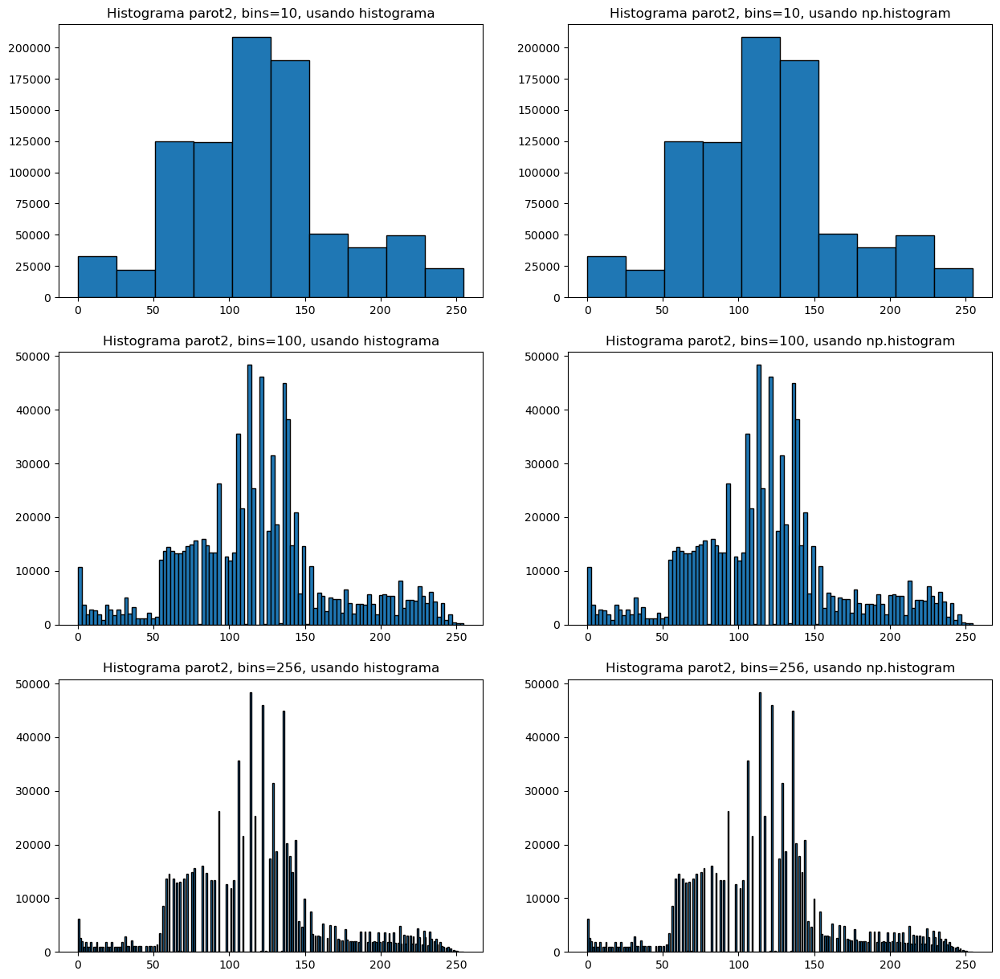

In [10]:
counts_parot2_10_np, bin_edges_parot2_10_np= np.histogram(parot2, 10)
counts_parot2_100_np, bin_edges_parot2_100_np= np.histogram(parot2, 100)
counts_parot2_256_np, bin_edges_parot2_256_np= np.histogram(parot2, 256)



fig, ax= plt.subplots(3,2, figsize=(15,15))
ax[0,0].bar(bin_edges_parot2_10[:-1], counts_parot2_10, width=np.diff(bin_edges_parot2_10), edgecolor="black", align="edge")
ax[1,0].bar(bin_edges_parot2_100[:-1], counts_parot2_100, width=np.diff(bin_edges_parot2_100), edgecolor="black", align="edge")
ax[2,0].bar(bin_edges_parot2_256[:-1], counts_parot2_256, width=np.diff(bin_edges_parot2_256), edgecolor="black", align="edge")
ax[0,1].bar(bin_edges_parot2_10_np[:-1], counts_parot2_10_np, width=np.diff(bin_edges_parot2_10_np), edgecolor="black", align="edge")
ax[1,1].bar(bin_edges_parot2_100_np[:-1], counts_parot2_100_np, width=np.diff(bin_edges_parot2_100_np), edgecolor="black", align="edge")
ax[2,1].bar(bin_edges_parot2_256_np[:-1], counts_parot2_256_np, width=np.diff(bin_edges_parot2_256_np), edgecolor="black", align="edge")

ax[0,0].set_title('Histograma parot2, bins=10, usando histograma')
ax[1,0].set_title('Histograma parot2, bins=100, usando histograma')
ax[2,0].set_title('Histograma parot2, bins=256, usando histograma')
ax[0,1].set_title('Histograma parot2, bins=10, usando np.histogram')
ax[1,1].set_title('Histograma parot2, bins=100, usando np.histogram')
ax[2,1].set_title('Histograma parot2, bins=256, usando np.histogram')

Se puede apreciar que las funciones 'histograma' y 'np.histogram' son intercambiables ya que devuelven exactamente el mismo histograma en todos los casos.

**c)** Calcular el histograma de la imagen ct_dcm.tif (imagen de 16 bits).  

Desplegar la imagen   

Buscar información sobre **ventana/nivel** (*Window/Level*) y explicar por qué tiene sentido usar este mecanismo para visualizar imágenes de tomografía computada. 

Text(0.5, 1.0, 'Histograma de ct_dcm.tif')

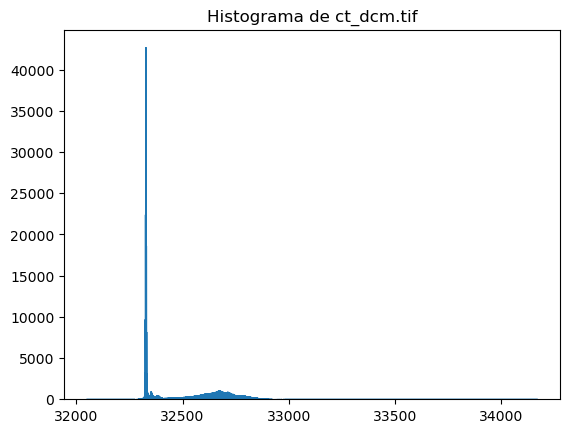

In [11]:
ct_dcm=imread('imagenes/ct_dcm.tif')
counts, bin_edges = histograma(ct_dcm.flatten(), 2**16)

plt.figure()
plt.stairs(counts, bin_edges)
plt.title('Histograma de ct_dcm.tif')

Text(0.5, 1.0, 'ct_dcm.tif')

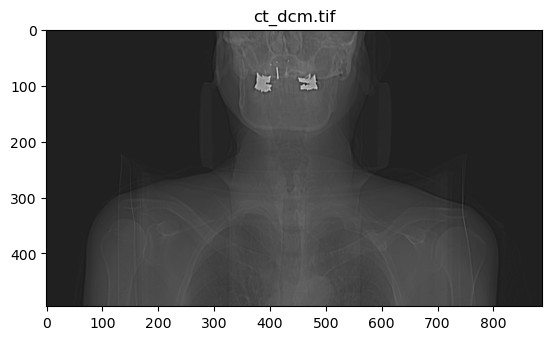

In [12]:
plt.figure()
plt.imshow(ct_dcm, cmap='gray')
plt.title('ct_dcm.tif')

Ventana/nivel, es una técnica utilizada en la visualización de imágenes médicas para ajustar el rango de intensidades mostrado en la imagen. La ventana representa el rango de valores de intensidad (en escala de grises), mientras que el nivel indica el valor central de este rango.  

Cuando se trabaja con imágenes de 16 bits, hay 2^16 posibles niveles de intensidad, lo que puede dificultar la visualización de detalles en la imagen. Para facilitar la visualización, es posible ajustar la ventana y el nivel de manera que se muestren sólo los valores de interés.  

En este caso, a partir del histograma se puede apreciar que hay muchos píxeles acumulados en la zona con niveles de gris entre 32300 y 32400, por lo que sería de interes ajustar la ventana y el nivel para poder diferenciar estos pixeles entre si, ya que si se visualiza como imágen de 8 bits, probablemente la mayoría de estos pixeles se vean de un mismo color.

**d)** Implementar una función que realice el matching de histogramas entre un par de imágenes. 

(Ver por ejemplo: http://paulbourke.net/miscellaneous/equalisation/ y https://en.wikipedia.org/wiki/Histogram_matching )

(Artículo interesante que hace algo levemente diferente a lo que se pide en este ejercicio: https://www.ipol.im/pub/art/2016/140/)



In [13]:
## Devuelve una imagen, la cual corresponde a ajustar el histograma de img al histograma de la imagen de referencia img_base
def matching(img, img_base):
    """
    Matching de histograma de una imagen con una imagen de referencia.

    Args:
        img (ndarray): La imagen de entrada.
        img_base (ndarray): La imagen de referencia.

    Returns:
        img_match (ndarray): La imagen con el histograma matcheado al de referencia
    
    """
    
    # IMPLEMENTAR
    hist_ac_img, bin_edges_img= histogramaAcumulado(img, 256)
    hist_ac_img_base, bin_edges_img_base= histogramaAcumulado(img_base, 256) 

    LUT=np.interp(hist_ac_img, hist_ac_img_base, range(256))
    img_match=np.interp(img, range(256), LUT)
    
    #LUT=np.interp(hist_ac_img, hist_ac_img_base, range(np.min(img_base)-np.max(img_base)+1))
    #img_match=np.interp(img, range(np.min(img_base)-np.max(img_base)+1), LUT)

    return img_match

**e)** Aplique el matching de histogramas entre dos imágenes (por ejemplo entre parot1.png y parot2.png y/o entre strike1.png y strike2.png). 

Muestre y analice los resultados.

Text(0.5, 1.0, 'strike1 matched')

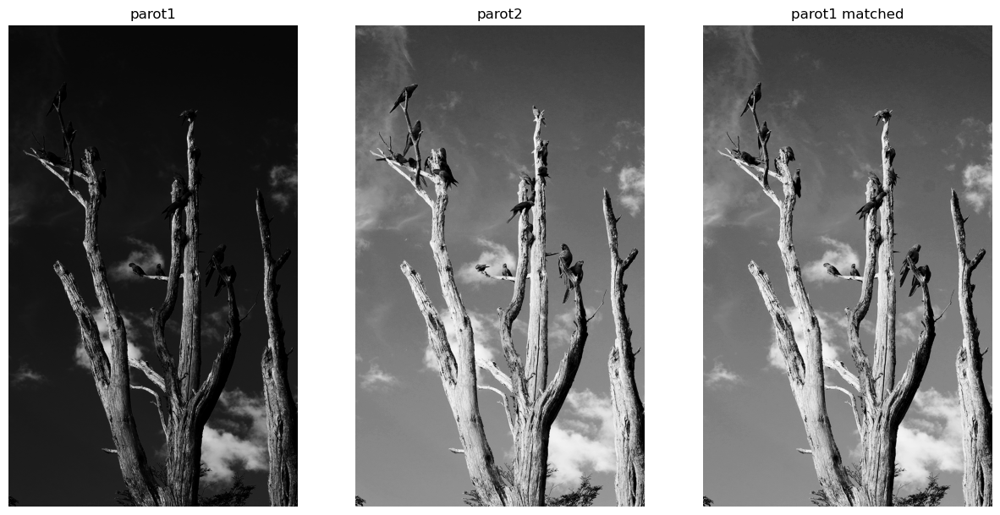

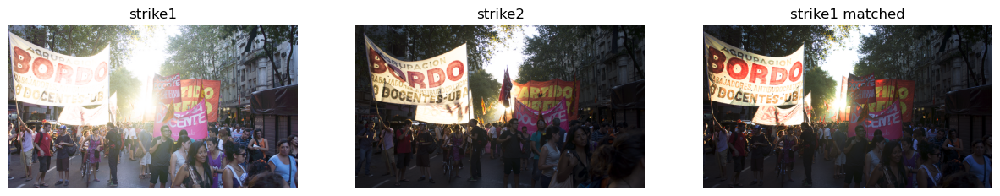

In [14]:
strike1=imread('imagenes/strike1.png')
strike2=imread('imagenes/strike2.png')

fig, ax= plt.subplots(1,3, figsize=(15,15))

ax[0].imshow(parot1, cmap='gray')
ax[1].imshow(parot2, cmap='gray')
ax[2].imshow(matching(parot1,parot2), cmap='gray')
ax[0].axis('off')
ax[1].axis('off')
ax[2].axis('off')
ax[0].set_title('parot1')
ax[1].set_title('parot2')
ax[2].set_title('parot1 matched')
fig, ax= plt.subplots(1,3, figsize=(15,15))
ax[0].imshow(strike1)
ax[1].imshow(strike2)
ax[2].imshow(np.stack((matching(strike1[:,:,0],strike2[:,:,0]),matching(strike1[:,:,1],strike2[:,:,1]),matching(strike1[:,:,2],strike2[:,:,2])),axis=-1).astype(np.uint8))
ax[0].axis('off')
ax[1].axis('off')
ax[2].axis('off')
ax[0].set_title('strike1')
ax[1].set_title('strike2')
ax[2].set_title('strike1 matched')

En el primer caso se puede ver que parot1 es mucho más oscura que parot2, pero luego de aplicar el matching de histogramas a parot1 ambas imagenes quedan con niveles similares de intensidad y por lo tanto se pueden apreciar más detalles.  
En el segundo caso se aprecia que strike1 es más clara que strike 2, pero al aplicar el matching de histogramas a strike1 ambas imagenes quedan igual de oscuras y por lo tanto se puede leer más claramente el texto de la pancarta.

##  3) Restauración de imágenes con ruido

**a) A partir de una imagen original, generar imágenes con diferentes niveles de ruido gaussiano (por ejemplo σ=5, 10, 20, 40) y ruido “sal y pimienta” (por ejemplo p=0.1, 0.3, 0.5, 0.8).**

Imágenes sugeridas: lena.bmp, peppers.png, baboon.png, (pasadas a gris en caso que estén en colores)   
Otras [imágenes estándar](http://en.wikipedia.org/wiki/Standard_test_image) se pueden encontrar en http://sipi.usc.edu/database/database.php?volume=misc    

In [15]:
def add_gaussian_noise(I,sigma):
    """
    Contaminar imagen con ruido Gaussiano de desviación estándar sigma.

    Args:
        I (ndarray): La imagen de entrada.
        sigma (float): Desviación estándar del ruido.

    Returns:
        J (ndarray): La imagen contaminada con ruido Gaussiano de desviación estándar sigma
    
    """

    # IMPLEMENTAR
    ruido=np.random.normal(0, sigma, I.shape)
    J=np.clip(I+ruido, 0, 255)
    return J

def add_saltpepper_noise(I,p):
    """
    Contaminar imagen con ruido sal y pimienta. Cada pixel tiene probabilidad p de ser contaminado.
    Se asume que, dado un pixel contaminado, la asignación de 0 o 255 (pepper y salt, respectivamente) es equiprobale.

    Args:
        I (ndarray): La imagen de entrada.
        p (float): Probabilidad de que un pixel sea contaminado.

    Returns:
        J (ndarray): La imagen contaminada con ruido sal y pimienta
    
    """
    # IMPLEMENTAR
    ruido=np.zeros(I.shape)
    a=np.random.random_sample(I.shape)
    salt=a<=p/2
    pepper= np.logical_and((a>p/2),(a<=p))
    ruido[salt]= 255
    ruido[pepper]= -255
    J=np.clip(I+ruido, 0, 255)
    return J

Text(0.5, 1.0, 'lena, p=0.8')

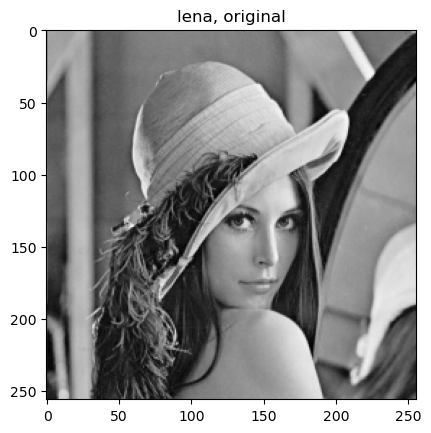

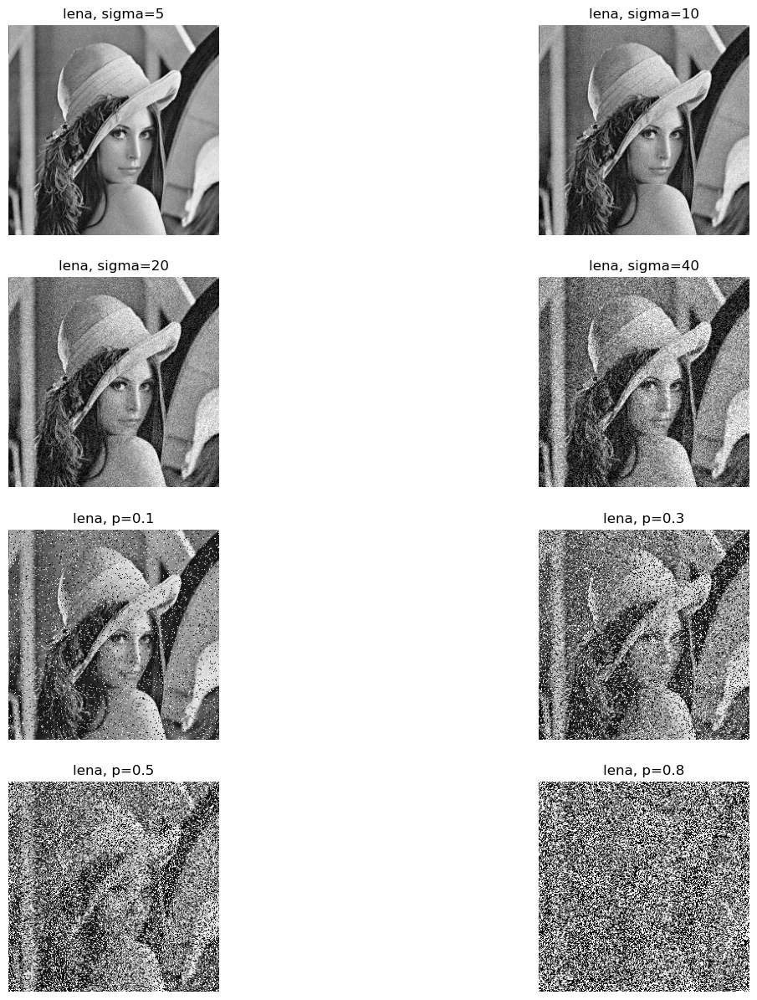

In [16]:
lena=imread(dir_base_imagenes+'lena.bmp')
plt.figure()
plt.imshow(lena, cmap='gray')
plt.title('lena, original')

lena_gauss_5=add_gaussian_noise(lena,5)
lena_gauss_10=add_gaussian_noise(lena,10)
lena_gauss_20=add_gaussian_noise(lena,20)
lena_gauss_40=add_gaussian_noise(lena,40)

lena_sp_01=add_saltpepper_noise(lena,0.1)
lena_sp_03=add_saltpepper_noise(lena,0.3)
lena_sp_05=add_saltpepper_noise(lena,0.5)
lena_sp_08=add_saltpepper_noise(lena,0.8)

fig, ax= plt.subplots(4,2, figsize=(15, 15))
ax[0,0].imshow(lena_gauss_5, cmap='gray')
ax[0,1].imshow(lena_gauss_10, cmap='gray')
ax[1,0].imshow(lena_gauss_20, cmap='gray')
ax[1,1].imshow(lena_gauss_40, cmap='gray')
ax[2,0].imshow(lena_sp_01, cmap='gray')
ax[2,1].imshow(lena_sp_03, cmap='gray')
ax[3,0].imshow(lena_sp_05, cmap='gray')
ax[3,1].imshow(lena_sp_08, cmap='gray')
ax[0,0].axis('off')
ax[0,1].axis('off')
ax[1,0].axis('off')
ax[1,1].axis('off')
ax[2,0].axis('off')
ax[2,1].axis('off')
ax[3,0].axis('off')
ax[3,1].axis('off')
ax[0,0].set_title('lena, sigma=5')
ax[0,1].set_title('lena, sigma=10')
ax[1,0].set_title('lena, sigma=20')
ax[1,1].set_title('lena, sigma=40')
ax[2,0].set_title('lena, p=0.1')
ax[2,1].set_title('lena, p=0.3')
ax[3,0].set_title('lena, p=0.5')
ax[3,1].set_title('lena, p=0.8')

**b) Procesar las imágenes de (a) con**
* filtros de media de diverso tamaño (implementar)
* filtros de mediana de diverso tamaño (implementar)
* Non local means (usar implementación de OpenCV y/o de scikit-image)

In [17]:
def meanFilter(I, filterSize):
    #filterSize: orden del filtro
    # IMPLEMENTAR
    J=I.copy()
    for i in range(filterSize,I.shape[0]-filterSize-1):
        for j in range(filterSize,I.shape[1]-filterSize-1):
            J[i,j]=np.mean(I[i-filterSize:i+filterSize+1,j-filterSize:j+filterSize+1])    
    return J

def medianFilter(I, filterSize):
    J=I.copy()
    for i in range(filterSize,I.shape[0]-filterSize-1):
        for j in range(filterSize,I.shape[1]-filterSize-1):
            J[i,j]=int(np.median(I[i-filterSize:i+filterSize+1,j-filterSize:j+filterSize+1]))    
    # IMPLEMENTAR
    
    return J

Text(0.5, 1.0, 'p=0.5, median order 3')

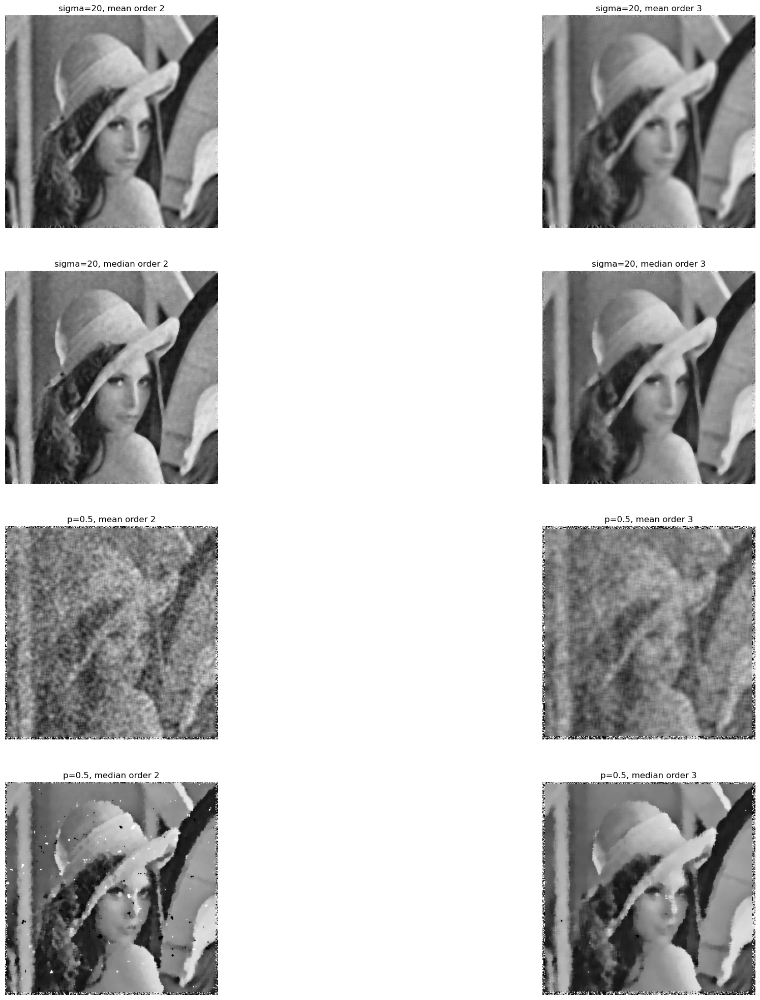

In [18]:
lena_gauss_5_mean_1=meanFilter(lena_gauss_5, 1)
lena_gauss_5_mean_2=meanFilter(lena_gauss_5, 2)
lena_gauss_5_mean_3=meanFilter(lena_gauss_5, 3)
lena_gauss_10_mean_1=meanFilter(lena_gauss_10, 1)
lena_gauss_10_mean_2=meanFilter(lena_gauss_10, 2)
lena_gauss_10_mean_3=meanFilter(lena_gauss_10, 3)
lena_gauss_20_mean_1=meanFilter(lena_gauss_20, 1)
lena_gauss_20_mean_2=meanFilter(lena_gauss_20, 2)
lena_gauss_20_mean_3=meanFilter(lena_gauss_20, 3)
lena_gauss_40_mean_1=meanFilter(lena_gauss_40, 1)
lena_gauss_40_mean_2=meanFilter(lena_gauss_40, 2)
lena_gauss_40_mean_3=meanFilter(lena_gauss_40, 3)
lena_gauss_5_median_1=medianFilter(lena_gauss_5, 1)
lena_gauss_5_median_2=medianFilter(lena_gauss_5, 2)
lena_gauss_5_median_3=medianFilter(lena_gauss_5, 3)
lena_gauss_10_median_1=medianFilter(lena_gauss_10, 1)
lena_gauss_10_median_2=medianFilter(lena_gauss_10, 2)
lena_gauss_10_median_3=medianFilter(lena_gauss_10, 3)
lena_gauss_20_median_1=medianFilter(lena_gauss_20, 1)
lena_gauss_20_median_2=medianFilter(lena_gauss_20, 2)
lena_gauss_20_median_3=medianFilter(lena_gauss_20, 3)
lena_gauss_40_median_1=medianFilter(lena_gauss_40, 1)
lena_gauss_40_median_2=medianFilter(lena_gauss_40, 2)
lena_gauss_40_median_3=medianFilter(lena_gauss_40, 3)

lena_sp_01_mean_1=meanFilter(lena_sp_01, 1)
lena_sp_01_mean_2=meanFilter(lena_sp_01, 2)
lena_sp_01_mean_3=meanFilter(lena_sp_01, 3)
lena_sp_03_mean_1=meanFilter(lena_sp_03, 1)
lena_sp_03_mean_2=meanFilter(lena_sp_03, 2)
lena_sp_03_mean_3=meanFilter(lena_sp_03, 3)
lena_sp_05_mean_1=meanFilter(lena_sp_05, 1)
lena_sp_05_mean_2=meanFilter(lena_sp_05, 2)
lena_sp_05_mean_3=meanFilter(lena_sp_05, 3)
lena_sp_08_mean_1=meanFilter(lena_sp_08, 1)
lena_sp_08_mean_2=meanFilter(lena_sp_08, 2)
lena_sp_08_mean_3=meanFilter(lena_sp_08, 3)
lena_sp_01_median_1=medianFilter(lena_sp_01, 1)
lena_sp_01_median_2=medianFilter(lena_sp_01, 2)
lena_sp_01_median_3=medianFilter(lena_sp_01, 3)
lena_sp_03_median_1=medianFilter(lena_sp_03, 1)
lena_sp_03_median_2=medianFilter(lena_sp_03, 2)
lena_sp_03_median_3=medianFilter(lena_sp_03, 3)
lena_sp_05_median_1=medianFilter(lena_sp_05, 1)
lena_sp_05_median_2=medianFilter(lena_sp_05, 2)
lena_sp_05_median_3=medianFilter(lena_sp_05, 3)
lena_sp_08_median_1=medianFilter(lena_sp_08, 1)
lena_sp_08_median_2=medianFilter(lena_sp_08, 2)
lena_sp_08_median_3=medianFilter(lena_sp_08, 3)

fig,ax=plt.subplots(4,2, figsize=(25,25))
ax[0,0].imshow(lena_gauss_20_mean_2, cmap='gray')
ax[0,1].imshow(lena_gauss_20_mean_3, cmap='gray')
ax[1,0].imshow(lena_gauss_20_median_2, cmap='gray')
ax[1,1].imshow(lena_gauss_20_median_3, cmap='gray')
ax[2,0].imshow(lena_sp_05_mean_2, cmap='gray')
ax[2,1].imshow(lena_sp_05_mean_3, cmap='gray')
ax[3,0].imshow(lena_sp_05_median_2, cmap='gray')
ax[3,1].imshow(lena_sp_05_median_3, cmap='gray')
ax[0,0].axis('off')
ax[0,1].axis('off')
ax[1,0].axis('off')
ax[1,1].axis('off')
ax[2,0].axis('off')
ax[2,1].axis('off')
ax[3,0].axis('off')
ax[3,1].axis('off')
ax[0,0].set_title('sigma=20, mean order 2')
ax[0,1].set_title('sigma=20, mean order 3')
ax[1,0].set_title('sigma=20, median order 2')
ax[1,1].set_title('sigma=20, median order 3')
ax[2,0].set_title('p=0.5, mean order 2')
ax[2,1].set_title('p=0.5, mean order 3')
ax[3,0].set_title('p=0.5, median order 2')
ax[3,1].set_title('p=0.5, median order 3')

**Ruido gaussiano, σ=20.**  
Se puede observar que en el caso del ruido gaussiano se obtiene una mayor disminución de ruido con los filtros de media, aunque si se compara con los filtros de mediana este filtro difumina mucho más los bordes. El difuminado de los bordes es mayor cuanto mayor es el tamaño del filtro. Esto se aprecia al comprar el resultado de aplicar filtro de media de orden 2 y orden 3 a la imagen.

**Ruido salt and pepper, p=0.5.**  
En el caso del ruido salt and pepper la diferencia entre los resultados después de aplicar filtro de media y mediana son aún más notorios. El filtro de media, en ambos casos difumina el ruido, lo que hace que la imagen quede borrosa, mientras que en el caso del filtro de mediana, elimina gran cantidad de los puntos saturados (el de mayor tamaño elimina más) y no difumina los bordes de la imagen, aunque si genera un efecto de "alisado" sobre las superficies por lo que se pierden texturas.

**c) Cuantificar la reducción de ruido utilizando medidas adecuadas (PSNR, RMSE).**  
Indicar cuáles de los algoritmos son adecuados para cada tipo de ruido.

Las métricas a usar pueden encontrarse en [skimage.metrics ](https://scikit-image.org/docs/stable/api/skimage.metrics.html)

(0.0, 1.0, 0.0, 1.0)

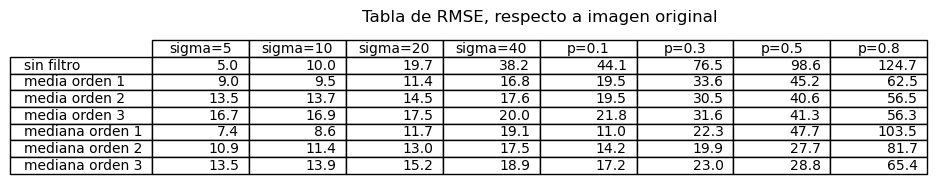

In [19]:
from skimage.metrics import mean_squared_error, peak_signal_noise_ratio
import pandas as pd

rmse_lena_gauss_5=np.sqrt(mean_squared_error(lena, lena_gauss_5))
rmse_lena_gauss_10=np.sqrt(mean_squared_error(lena, lena_gauss_10))
rmse_lena_gauss_20=np.sqrt(mean_squared_error(lena, lena_gauss_20))
rmse_lena_gauss_40=np.sqrt(mean_squared_error(lena, lena_gauss_40))
rmse_lena_gauss_5_mean_1=np.sqrt(mean_squared_error(lena, lena_gauss_5_mean_1))
rmse_lena_gauss_5_mean_2=np.sqrt(mean_squared_error(lena, lena_gauss_5_mean_2))
rmse_lena_gauss_5_mean_3=np.sqrt(mean_squared_error(lena, lena_gauss_5_mean_3))
rmse_lena_gauss_10_mean_1=np.sqrt(mean_squared_error(lena, lena_gauss_10_mean_1))
rmse_lena_gauss_10_mean_2=np.sqrt(mean_squared_error(lena, lena_gauss_10_mean_2))
rmse_lena_gauss_10_mean_3=np.sqrt(mean_squared_error(lena, lena_gauss_10_mean_3))
rmse_lena_gauss_20_mean_1=np.sqrt(mean_squared_error(lena, lena_gauss_20_mean_1))
rmse_lena_gauss_20_mean_2=np.sqrt(mean_squared_error(lena, lena_gauss_20_mean_2))
rmse_lena_gauss_20_mean_3=np.sqrt(mean_squared_error(lena, lena_gauss_20_mean_3))
rmse_lena_gauss_40_mean_1=np.sqrt(mean_squared_error(lena, lena_gauss_40_mean_1))
rmse_lena_gauss_40_mean_2=np.sqrt(mean_squared_error(lena, lena_gauss_40_mean_2))
rmse_lena_gauss_40_mean_3=np.sqrt(mean_squared_error(lena, lena_gauss_40_mean_3))
rmse_lena_gauss_5_median_1=np.sqrt(mean_squared_error(lena, lena_gauss_5_median_1))
rmse_lena_gauss_5_median_2=np.sqrt(mean_squared_error(lena, lena_gauss_5_median_2))
rmse_lena_gauss_5_median_3=np.sqrt(mean_squared_error(lena, lena_gauss_5_median_3))
rmse_lena_gauss_10_median_1=np.sqrt(mean_squared_error(lena, lena_gauss_10_median_1))
rmse_lena_gauss_10_median_2=np.sqrt(mean_squared_error(lena, lena_gauss_10_median_2))
rmse_lena_gauss_10_median_3=np.sqrt(mean_squared_error(lena, lena_gauss_10_median_3))
rmse_lena_gauss_20_median_1=np.sqrt(mean_squared_error(lena, lena_gauss_20_median_1))
rmse_lena_gauss_20_median_2=np.sqrt(mean_squared_error(lena, lena_gauss_20_median_2))
rmse_lena_gauss_20_median_3=np.sqrt(mean_squared_error(lena, lena_gauss_20_median_3))
rmse_lena_gauss_40_median_1=np.sqrt(mean_squared_error(lena, lena_gauss_40_median_1))
rmse_lena_gauss_40_median_2=np.sqrt(mean_squared_error(lena, lena_gauss_40_median_2))
rmse_lena_gauss_40_median_3=np.sqrt(mean_squared_error(lena, lena_gauss_40_median_3))

rmse_lena_sp_01=np.sqrt(mean_squared_error(lena, lena_sp_01))
rmse_lena_sp_03=np.sqrt(mean_squared_error(lena, lena_sp_03))
rmse_lena_sp_05=np.sqrt(mean_squared_error(lena, lena_sp_05))
rmse_lena_sp_08=np.sqrt(mean_squared_error(lena, lena_sp_08))
rmse_lena_sp_01_mean_1=np.sqrt(mean_squared_error(lena, lena_sp_01_mean_1))
rmse_lena_sp_01_mean_2=np.sqrt(mean_squared_error(lena, lena_sp_01_mean_2))
rmse_lena_sp_01_mean_3=np.sqrt(mean_squared_error(lena, lena_sp_01_mean_3))
rmse_lena_sp_03_mean_1=np.sqrt(mean_squared_error(lena, lena_sp_03_mean_1))
rmse_lena_sp_03_mean_2=np.sqrt(mean_squared_error(lena, lena_sp_03_mean_2))
rmse_lena_sp_03_mean_3=np.sqrt(mean_squared_error(lena, lena_sp_03_mean_3))
rmse_lena_sp_05_mean_1=np.sqrt(mean_squared_error(lena, lena_sp_05_mean_1))
rmse_lena_sp_05_mean_2=np.sqrt(mean_squared_error(lena, lena_sp_05_mean_2))
rmse_lena_sp_05_mean_3=np.sqrt(mean_squared_error(lena, lena_sp_05_mean_3))
rmse_lena_sp_08_mean_1=np.sqrt(mean_squared_error(lena, lena_sp_08_mean_1))
rmse_lena_sp_08_mean_2=np.sqrt(mean_squared_error(lena, lena_sp_08_mean_2))
rmse_lena_sp_08_mean_3=np.sqrt(mean_squared_error(lena, lena_sp_08_mean_3))
rmse_lena_sp_01_median_1=np.sqrt(mean_squared_error(lena, lena_sp_01_median_1))
rmse_lena_sp_01_median_2=np.sqrt(mean_squared_error(lena, lena_sp_01_median_2))
rmse_lena_sp_01_median_3=np.sqrt(mean_squared_error(lena, lena_sp_01_median_3))
rmse_lena_sp_03_median_1=np.sqrt(mean_squared_error(lena, lena_sp_03_median_1))
rmse_lena_sp_03_median_2=np.sqrt(mean_squared_error(lena, lena_sp_03_median_2))
rmse_lena_sp_03_median_3=np.sqrt(mean_squared_error(lena, lena_sp_03_median_3))
rmse_lena_sp_05_median_1=np.sqrt(mean_squared_error(lena, lena_sp_05_median_1))
rmse_lena_sp_05_median_2=np.sqrt(mean_squared_error(lena, lena_sp_05_median_2))
rmse_lena_sp_05_median_3=np.sqrt(mean_squared_error(lena, lena_sp_05_median_3))
rmse_lena_sp_08_median_1=np.sqrt(mean_squared_error(lena, lena_sp_08_median_1))
rmse_lena_sp_08_median_2=np.sqrt(mean_squared_error(lena, lena_sp_08_median_2))
rmse_lena_sp_08_median_3=np.sqrt(mean_squared_error(lena, lena_sp_08_median_3))

diccionario={'filtro': ['sin filtro','media orden 1','media orden 2','media orden 3','mediana orden 1','mediana orden 2','mediana orden 3'],
     'sigma=5': [rmse_lena_gauss_5,rmse_lena_gauss_5_mean_1,rmse_lena_gauss_5_mean_2,rmse_lena_gauss_5_mean_3, rmse_lena_gauss_5_median_1,rmse_lena_gauss_5_median_2,rmse_lena_gauss_5_median_3],
     'sigma=10': [rmse_lena_gauss_10,rmse_lena_gauss_10_mean_1,rmse_lena_gauss_10_mean_2,rmse_lena_gauss_10_mean_3, rmse_lena_gauss_10_median_1,rmse_lena_gauss_10_median_2,rmse_lena_gauss_10_median_3],
     'sigma=20': [rmse_lena_gauss_20,rmse_lena_gauss_20_mean_1,rmse_lena_gauss_20_mean_2,rmse_lena_gauss_20_mean_3, rmse_lena_gauss_20_median_1,rmse_lena_gauss_20_median_2,rmse_lena_gauss_20_median_3],
     'sigma=40': [rmse_lena_gauss_40,rmse_lena_gauss_40_mean_1,rmse_lena_gauss_40_mean_2,rmse_lena_gauss_40_mean_3, rmse_lena_gauss_40_median_1,rmse_lena_gauss_40_median_2,rmse_lena_gauss_40_median_3],
     'p=0.1': [rmse_lena_sp_01,rmse_lena_sp_01_mean_1,rmse_lena_sp_01_mean_2,rmse_lena_sp_01_mean_3, rmse_lena_sp_01_median_1,rmse_lena_sp_01_median_2,rmse_lena_sp_01_median_3],
     'p=0.3': [rmse_lena_sp_03,rmse_lena_sp_03_mean_1,rmse_lena_sp_03_mean_2,rmse_lena_sp_03_mean_3, rmse_lena_sp_03_median_1,rmse_lena_sp_03_median_2,rmse_lena_sp_03_median_3],
     'p=0.5': [rmse_lena_sp_05,rmse_lena_sp_05_mean_1,rmse_lena_sp_05_mean_2,rmse_lena_sp_05_mean_3, rmse_lena_sp_05_median_1,rmse_lena_sp_05_median_2,rmse_lena_sp_05_median_3],
     'p=0.8': [rmse_lena_sp_08,rmse_lena_sp_08_mean_1,rmse_lena_sp_08_mean_2,rmse_lena_sp_08_mean_3, rmse_lena_sp_08_median_1,rmse_lena_sp_08_median_2,rmse_lena_sp_08_median_3]}

tabla=pd.DataFrame(diccionario)
tabla.set_index('filtro', inplace=True)
tabla=tabla.round(1)
plt.figure(figsize=(10,2))
plt.table(cellText = tabla.values,
          rowLabels = tabla.index,
          colLabels = tabla.columns,
          loc = "center"
         )
plt.title("Tabla de RMSE, respecto a imagen original")

plt.axis("off")

(0.0, 1.0, 0.0, 1.0)

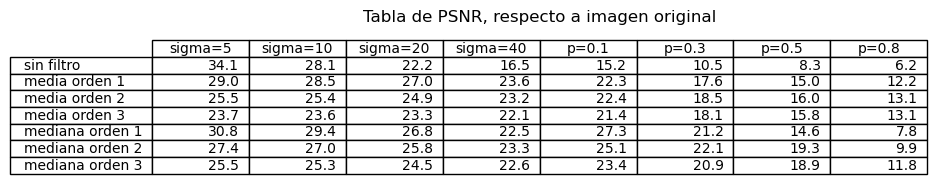

In [20]:
psnr_lena_gauss_5=peak_signal_noise_ratio(lena, lena_gauss_5.astype(np.uint8))
psnr_lena_gauss_10=peak_signal_noise_ratio(lena, lena_gauss_10.astype(np.uint8))
psnr_lena_gauss_20=peak_signal_noise_ratio(lena, lena_gauss_20.astype(np.uint8))
psnr_lena_gauss_40=peak_signal_noise_ratio(lena, lena_gauss_40.astype(np.uint8))
psnr_lena_gauss_5_mean_1=peak_signal_noise_ratio(lena, lena_gauss_5_mean_1.astype(np.uint8))
psnr_lena_gauss_5_mean_2=peak_signal_noise_ratio(lena, lena_gauss_5_mean_2.astype(np.uint8))
psnr_lena_gauss_5_mean_3=peak_signal_noise_ratio(lena, lena_gauss_5_mean_3.astype(np.uint8))
psnr_lena_gauss_10_mean_1=peak_signal_noise_ratio(lena, lena_gauss_10_mean_1.astype(np.uint8))
psnr_lena_gauss_10_mean_2=peak_signal_noise_ratio(lena, lena_gauss_10_mean_2.astype(np.uint8))
psnr_lena_gauss_10_mean_3=peak_signal_noise_ratio(lena, lena_gauss_10_mean_3.astype(np.uint8))
psnr_lena_gauss_20_mean_1=peak_signal_noise_ratio(lena, lena_gauss_20_mean_1.astype(np.uint8))
psnr_lena_gauss_20_mean_2=peak_signal_noise_ratio(lena, lena_gauss_20_mean_2.astype(np.uint8))
psnr_lena_gauss_20_mean_3=peak_signal_noise_ratio(lena, lena_gauss_20_mean_3.astype(np.uint8))
psnr_lena_gauss_40_mean_1=peak_signal_noise_ratio(lena, lena_gauss_40_mean_1.astype(np.uint8))
psnr_lena_gauss_40_mean_2=peak_signal_noise_ratio(lena, lena_gauss_40_mean_2.astype(np.uint8))
psnr_lena_gauss_40_mean_3=peak_signal_noise_ratio(lena, lena_gauss_40_mean_3.astype(np.uint8))
psnr_lena_gauss_5_median_1=peak_signal_noise_ratio(lena, lena_gauss_5_median_1.astype(np.uint8))
psnr_lena_gauss_5_median_2=peak_signal_noise_ratio(lena, lena_gauss_5_median_2.astype(np.uint8))
psnr_lena_gauss_5_median_3=peak_signal_noise_ratio(lena, lena_gauss_5_median_3.astype(np.uint8))
psnr_lena_gauss_10_median_1=peak_signal_noise_ratio(lena, lena_gauss_10_median_1.astype(np.uint8))
psnr_lena_gauss_10_median_2=peak_signal_noise_ratio(lena, lena_gauss_10_median_2.astype(np.uint8))
psnr_lena_gauss_10_median_3=peak_signal_noise_ratio(lena, lena_gauss_10_median_3.astype(np.uint8))
psnr_lena_gauss_20_median_1=peak_signal_noise_ratio(lena, lena_gauss_20_median_1.astype(np.uint8))
psnr_lena_gauss_20_median_2=peak_signal_noise_ratio(lena, lena_gauss_20_median_2.astype(np.uint8))
psnr_lena_gauss_20_median_3=peak_signal_noise_ratio(lena, lena_gauss_20_median_3.astype(np.uint8))
psnr_lena_gauss_40_median_1=peak_signal_noise_ratio(lena, lena_gauss_40_median_1.astype(np.uint8))
psnr_lena_gauss_40_median_2=peak_signal_noise_ratio(lena, lena_gauss_40_median_2.astype(np.uint8))
psnr_lena_gauss_40_median_3=peak_signal_noise_ratio(lena, lena_gauss_40_median_3.astype(np.uint8))

psnr_lena_sp_01=peak_signal_noise_ratio(lena, lena_sp_01.astype(np.uint8))
psnr_lena_sp_03=peak_signal_noise_ratio(lena, lena_sp_03.astype(np.uint8))
psnr_lena_sp_05=peak_signal_noise_ratio(lena, lena_sp_05.astype(np.uint8))
psnr_lena_sp_08=peak_signal_noise_ratio(lena, lena_sp_08.astype(np.uint8))
psnr_lena_sp_01_mean_1=peak_signal_noise_ratio(lena, lena_sp_01_mean_1.astype(np.uint8))
psnr_lena_sp_01_mean_2=peak_signal_noise_ratio(lena, lena_sp_01_mean_2.astype(np.uint8))
psnr_lena_sp_01_mean_3=peak_signal_noise_ratio(lena, lena_sp_01_mean_3.astype(np.uint8))
psnr_lena_sp_03_mean_1=peak_signal_noise_ratio(lena, lena_sp_03_mean_1.astype(np.uint8))
psnr_lena_sp_03_mean_2=peak_signal_noise_ratio(lena, lena_sp_03_mean_2.astype(np.uint8))
psnr_lena_sp_03_mean_3=peak_signal_noise_ratio(lena, lena_sp_03_mean_3.astype(np.uint8))
psnr_lena_sp_05_mean_1=peak_signal_noise_ratio(lena, lena_sp_05_mean_1.astype(np.uint8))
psnr_lena_sp_05_mean_2=peak_signal_noise_ratio(lena, lena_sp_05_mean_2.astype(np.uint8))
psnr_lena_sp_05_mean_3=peak_signal_noise_ratio(lena, lena_sp_05_mean_3.astype(np.uint8))
psnr_lena_sp_08_mean_1=peak_signal_noise_ratio(lena, lena_sp_08_mean_1.astype(np.uint8))
psnr_lena_sp_08_mean_2=peak_signal_noise_ratio(lena, lena_sp_08_mean_2.astype(np.uint8))
psnr_lena_sp_08_mean_3=peak_signal_noise_ratio(lena, lena_sp_08_mean_3.astype(np.uint8))
psnr_lena_sp_01_median_1=peak_signal_noise_ratio(lena, lena_sp_01_median_1.astype(np.uint8))
psnr_lena_sp_01_median_2=peak_signal_noise_ratio(lena, lena_sp_01_median_2.astype(np.uint8))
psnr_lena_sp_01_median_3=peak_signal_noise_ratio(lena, lena_sp_01_median_3.astype(np.uint8))
psnr_lena_sp_03_median_1=peak_signal_noise_ratio(lena, lena_sp_03_median_1.astype(np.uint8))
psnr_lena_sp_03_median_2=peak_signal_noise_ratio(lena, lena_sp_03_median_2.astype(np.uint8))
psnr_lena_sp_03_median_3=peak_signal_noise_ratio(lena, lena_sp_03_median_3.astype(np.uint8))
psnr_lena_sp_05_median_1=peak_signal_noise_ratio(lena, lena_sp_05_median_1.astype(np.uint8))
psnr_lena_sp_05_median_2=peak_signal_noise_ratio(lena, lena_sp_05_median_2.astype(np.uint8))
psnr_lena_sp_05_median_3=peak_signal_noise_ratio(lena, lena_sp_05_median_3.astype(np.uint8))
psnr_lena_sp_08_median_1=peak_signal_noise_ratio(lena, lena_sp_08_median_1.astype(np.uint8))
psnr_lena_sp_08_median_2=peak_signal_noise_ratio(lena, lena_sp_08_median_2.astype(np.uint8))
psnr_lena_sp_08_median_3=peak_signal_noise_ratio(lena, lena_sp_08_median_3.astype(np.uint8))

diccionario={'filtro': ['sin filtro','media orden 1','media orden 2','media orden 3','mediana orden 1','mediana orden 2','mediana orden 3'],
     'sigma=5': [psnr_lena_gauss_5,psnr_lena_gauss_5_mean_1,psnr_lena_gauss_5_mean_2,psnr_lena_gauss_5_mean_3, psnr_lena_gauss_5_median_1,psnr_lena_gauss_5_median_2,psnr_lena_gauss_5_median_3],
     'sigma=10': [psnr_lena_gauss_10,psnr_lena_gauss_10_mean_1,psnr_lena_gauss_10_mean_2,psnr_lena_gauss_10_mean_3, psnr_lena_gauss_10_median_1,psnr_lena_gauss_10_median_2,psnr_lena_gauss_10_median_3],
     'sigma=20': [psnr_lena_gauss_20,psnr_lena_gauss_20_mean_1,psnr_lena_gauss_20_mean_2,psnr_lena_gauss_20_mean_3, psnr_lena_gauss_20_median_1,psnr_lena_gauss_20_median_2,psnr_lena_gauss_20_median_3],
     'sigma=40': [psnr_lena_gauss_40,psnr_lena_gauss_40_mean_1,psnr_lena_gauss_40_mean_2,psnr_lena_gauss_40_mean_3, psnr_lena_gauss_40_median_1,psnr_lena_gauss_40_median_2,psnr_lena_gauss_40_median_3],
     'p=0.1': [psnr_lena_sp_01,psnr_lena_sp_01_mean_1,psnr_lena_sp_01_mean_2,psnr_lena_sp_01_mean_3, psnr_lena_sp_01_median_1,psnr_lena_sp_01_median_2,psnr_lena_sp_01_median_3],
     'p=0.3': [psnr_lena_sp_03,psnr_lena_sp_03_mean_1,psnr_lena_sp_03_mean_2,psnr_lena_sp_03_mean_3, psnr_lena_sp_03_median_1,psnr_lena_sp_03_median_2,psnr_lena_sp_03_median_3],
     'p=0.5': [psnr_lena_sp_05,psnr_lena_sp_05_mean_1,psnr_lena_sp_05_mean_2,psnr_lena_sp_05_mean_3, psnr_lena_sp_05_median_1,psnr_lena_sp_05_median_2,psnr_lena_sp_05_median_3],
     'p=0.8': [psnr_lena_sp_08,psnr_lena_sp_08_mean_1,psnr_lena_sp_08_mean_2,psnr_lena_sp_08_mean_3, psnr_lena_sp_08_median_1,psnr_lena_sp_08_median_2,psnr_lena_sp_08_median_3]}

tabla=pd.DataFrame(diccionario)
tabla.set_index('filtro', inplace=True)
tabla=tabla.round(1)
plt.figure(figsize=(10,2))
plt.table(cellText = tabla.values,
          rowLabels = tabla.index,
          colLabels = tabla.columns,
          loc = "center"
         )
plt.title("Tabla de PSNR, respecto a imagen original")

plt.axis("off")

**Nota:** En caso que lo deseen, la parte de cuantificación puede realizarse en Fiji mediante el plugin SNR como se muestra en el video de Restauración.  
Para eso, se puede guardar las imágenes originales, ruidosas y restauradas generadas en el notebook y luego procesarlas con Fiji.  
El plugin se encuentra disponible en http://bigwww.epfl.ch/sage/soft/snr/.
También se encuentra como ejemplo el macro *Macro_noise.ijm* para generar las imagenes ruidosas y la restauración.

Si se sigue este último camino, comparar con el resultado de skimage.metrics para alguna restauración hecha.

Tanto si nos guiamos por la tabla de RMSE, como por la de PSNR, salvo para contados casos que se dan cuando la contaminación es muy alta (σ=40, p=0.5 y p=0.8), en todos los casos el filtro de mediana da mejores resultados.  

Algo curioso que se puede ver en ambas tablas es que para el caso de ruido gaussiano con σ=5 y en ciertos casos con σ=10, los filtros aumentan el ruido.


## 4) Movimiento lineal uniforme 

**a) Ver PSF y MTF del movimiento lineal uniforme (se provee una función que calcula la PSF a partir del largo y el ángulo del movimiento)**    

Para un cierto movimiento lineal, mostrar PSF y MTF. Analizar qué forma tiene la MTF.  

Aplicar el movimiento sobre una imagen y mostrar las imágenes original y degradada y sus transformadas.

In [21]:
from skimage import transform
import numpy as np

def motionPSF(largo=9,angulo=0, sz=65):
    # Se genera una imagen cuadrada de lado sz y se pinta una linea horizontal 
    # en el medio de la imagen de tamaño igual al largo
    f = np.zeros((sz,sz)) 
    f[sz // 2, sz // 2 - largo//2 : sz // 2 + largo//2 + 1]=1  # "//" hace una división entera  
    # Luego se rota el angulo especificado
    f = transform.rotate(f,angulo);
    # Finalmente se normaliza
    f = f/np.sum(f);
    return f

Text(0.5, 1.0, 'MTF de movimiento lineal de 9 pixeles y ángulo 45°')

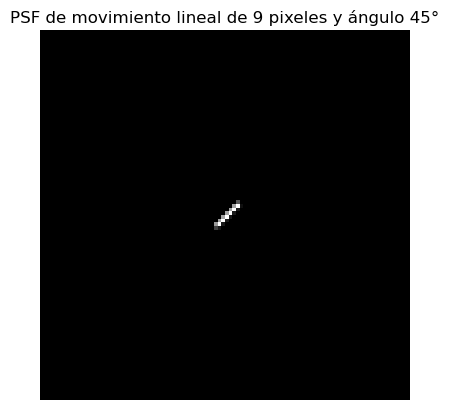

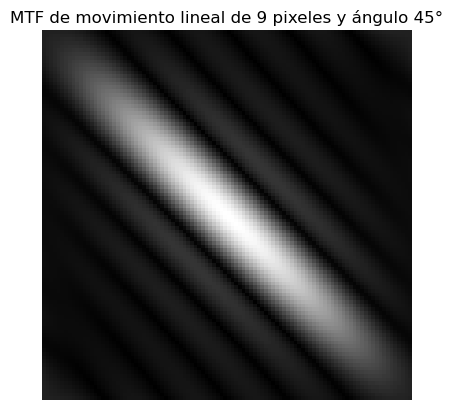

In [22]:
from scipy.fftpack import fft2, ifft2, fftshift

lena=imread(dir_base_imagenes+'lena.bmp').astype(float)

PSF_9_45=motionPSF(9, 45, 100)
MTF_9_45=abs(fftshift(fft2(PSF_9_45)))

plt.figure()
plt.imshow(PSF_9_45, cmap='gray')
plt.axis('Off')
plt.title('PSF de movimiento lineal de 9 pixeles y ángulo 45°')

plt.figure()
plt.imshow(MTF_9_45, cmap='gray')
plt.axis('Off')
plt.title('MTF de movimiento lineal de 9 pixeles y ángulo 45°')

Text(0.5, 1.0, 'FFT de lena con movimiento lineal')

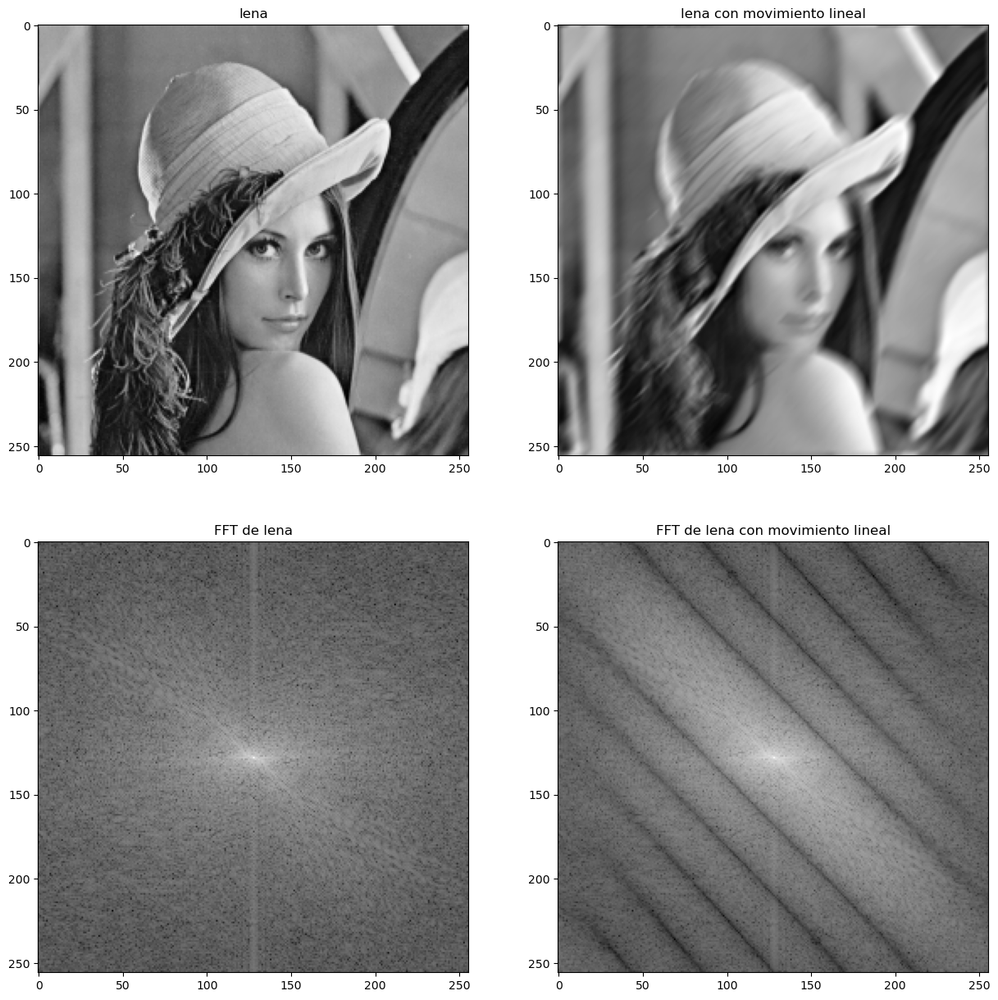

In [23]:
from scipy.ndimage import convolve

#Defino funcion que genera matriz para mover el centro de la PSF en frecuencia y así ajustar traslación de la imagen
def ajustar_traslacion(img, psf):
    di= -psf.shape[0]/2
    dj= -psf.shape[1]/2
    
    [iF,jF]=np.meshgrid(np.arange(0,img.shape[0]), np.arange(0,img.shape[1]), indexing='ij')
    transl_F= np.exp(-1j*2*np.pi*(iF*di/img.shape[0]+jF*dj/img.shape[1]))
    return transl_F

#lena_mov=convolve(lena, PSF_9_45)

lena_mov=ifft2(np.multiply(fft2(lena),fft2(PSF_9_45, shape=lena.shape)*ajustar_traslacion(lena, PSF_9_45))).real

fig, ax=plt.subplots(2,2, figsize=(15,15))
ax[0,0].imshow(lena, cmap='gray')
ax[0,0].set_title('lena')
ax[0,1].imshow(lena_mov, cmap='gray')
ax[0,1].set_title('lena con movimiento lineal')
ax[1,0].imshow(np.log(np.abs(fftshift(fft2(lena)))), cmap='gray')
ax[1,0].set_title('FFT de lena')
ax[1,1].imshow(np.log(np.abs(fftshift(fft2(lena_mov)))), cmap='gray')
ax[1,1].set_title('FFT de lena con movimiento lineal')


**b) Se busca hacer visible el número de matrícula en las imágenes blurred1.png, blurred2.png, blurred3.png.  
Intente restaurar las imágenes utilizando las siguientes técnicas:**

* Filtrado inverso (implementar)   
* Filtrado pseudo inverso (implementar)    
* Filtrado de Wiener (usar la función “wiener” del paquete skimage.restoration con diversos parámetros)

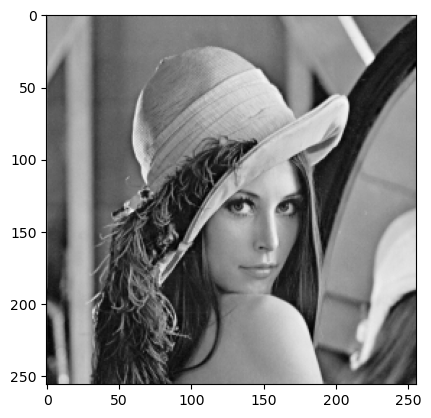

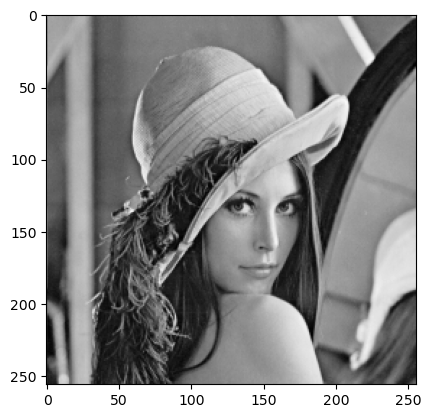

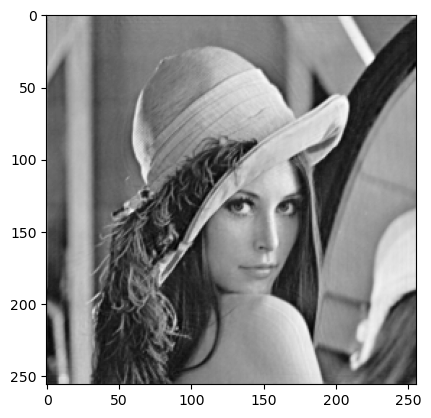

In [24]:
#Celda de prueba con lena_mov
from skimage.restoration import wiener

OTF_9_45=fft2(PSF_9_45, shape=lena_mov.shape)*ajustar_traslacion(lena, PSF_9_45)


lena_mov_filt_inv=ifft2(fft2(lena_mov)/OTF_9_45).real
lena_mov_filt_sinv=ifft2(fft2(lena_mov)/(OTF_9_45+1e-6)).real
lena_mov_filt_wiener=wiener(lena_mov, PSF_9_45, 0.0001, clip=False)

plt.figure()
plt.imshow(lena_mov_filt_inv, cmap='gray')

plt.figure()
plt.imshow(lena_mov_filt_sinv, cmap='gray')

plt.figure()
plt.imshow(lena_mov_filt_wiener, cmap='gray')

Se puede ver que todos los filtrados funcionan bien en este caso que se conoce exactamente la PSF aplicada.

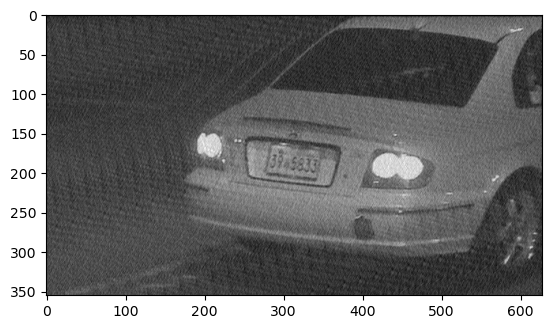

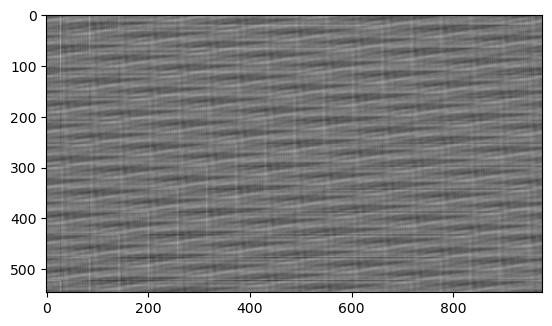

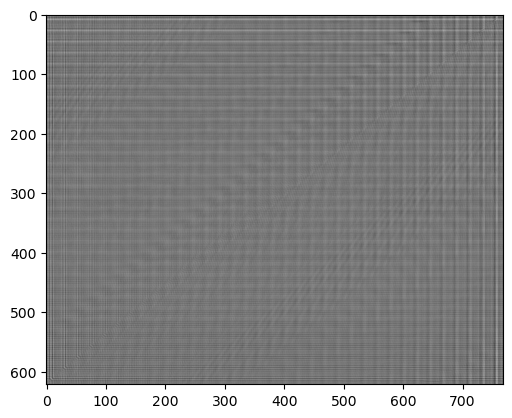

In [25]:
#Se pasan las imagenes a escala de gris
blurred1=np.mean(imread('imagenes/blurred1.png').astype(float),axis=2)
blurred2=np.mean(imread('imagenes/blurred2.png').astype(float),axis=2)
blurred3=np.mean(imread('imagenes/blurred3.png').astype(float),axis=2)

#Se mide el largo y ángulo del movimiento en fiji y se genera la PSF para cada imagen
PSF_blurred1=motionPSF(20, 15, 100)
PSF_blurred2=motionPSF(73, 38, 100)
PSF_blurred3=motionPSF(29, 40, 100)

OTF_blurred1=fft2(PSF_blurred1, shape=blurred1.shape)*ajustar_traslacion(blurred1, PSF_blurred1)
OTF_blurred2=fft2(PSF_blurred2, shape=blurred2.shape)*ajustar_traslacion(blurred2, PSF_blurred2)
OTF_blurred3=fft2(PSF_blurred3, shape=blurred3.shape)*ajustar_traslacion(blurred3, PSF_blurred3)

blurred1_filt_inv=ifft2(fft2(blurred1)/OTF_blurred1).real
blurred2_filt_inv=ifft2(fft2(blurred2)/OTF_blurred2).real
blurred3_filt_inv=ifft2(fft2(blurred3)/OTF_blurred3).real

plt.figure()
plt.imshow(blurred1_filt_inv, cmap='gray')

plt.figure()
plt.imshow(blurred2_filt_inv, cmap='gray')

plt.figure()
plt.imshow(blurred3_filt_inv, cmap='gray')

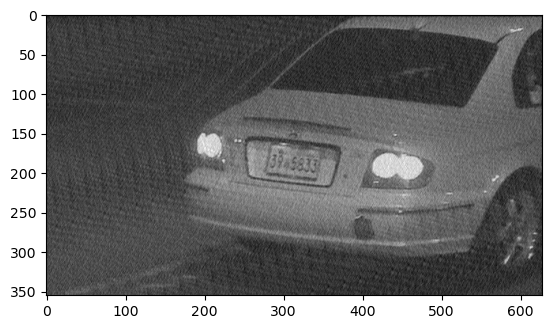

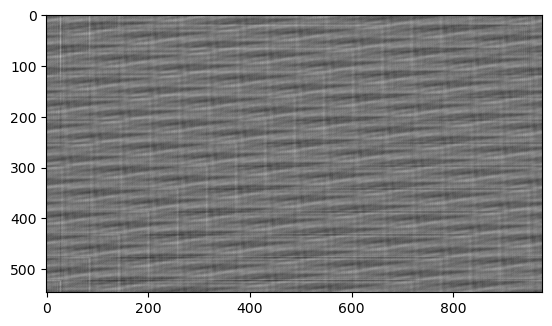

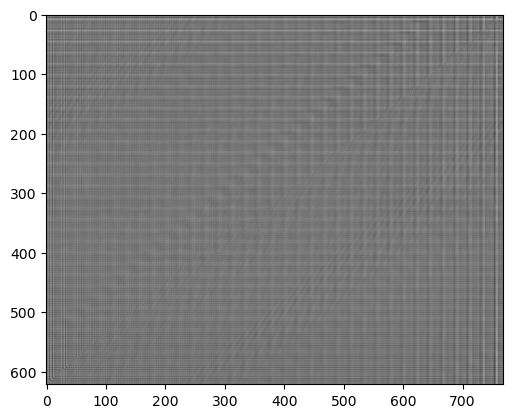

In [26]:
blurred1_filt_sinv=ifft2(fft2(blurred1)/(OTF_blurred1+1e-6)).real
blurred2_filt_sinv=ifft2(fft2(blurred2)/(OTF_blurred2+1e-6)).real
blurred3_filt_sinv=ifft2(fft2(blurred3)/(OTF_blurred3+1e-6)).real

plt.figure()
plt.imshow(blurred1_filt_sinv, cmap='gray')

plt.figure()
plt.imshow(blurred2_filt_sinv, cmap='gray')

plt.figure()
plt.imshow(blurred3_filt_sinv, cmap='gray')

#Hacerlo de vuelta pero sin convolve, multiplicando en frecuencia, la idea es que el resultado sea malo

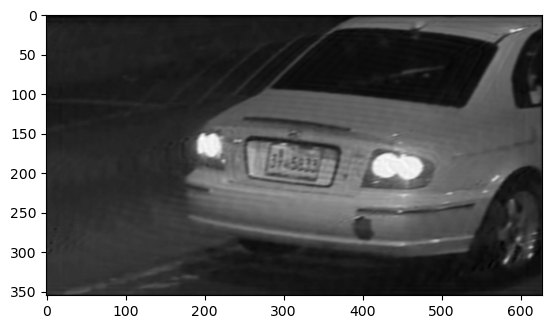

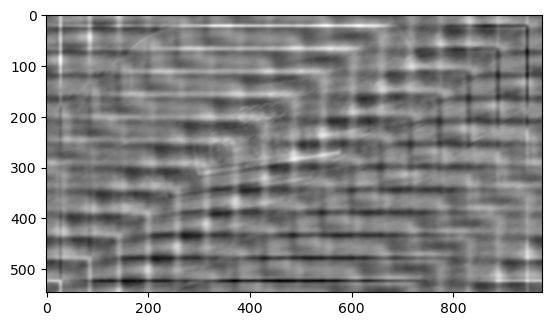

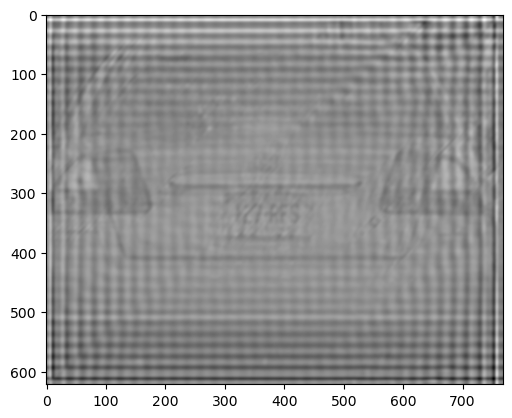

In [27]:
from skimage.restoration import wiener

blurred1_filt_wiener=wiener(blurred1, PSF_blurred1, 0.01, clip=False)
blurred2_filt_wiener=wiener(blurred2, PSF_blurred2, 0.02, clip=False)
blurred3_filt_wiener=wiener(blurred3, PSF_blurred3, 0.1, clip=False)

plt.figure()
plt.imshow(blurred1_filt_wiener, cmap='gray')

plt.figure()
plt.imshow(blurred2_filt_wiener, cmap='gray')

plt.figure()
plt.imshow(blurred3_filt_wiener, cmap='gray')

Para blurred1 se llegó a un resultado sumamente satisfactorio, ya que con cualquiera de los tres filtrados se puede identificar el número de matrícula: "39 5833".  
Para blurred2 con ninguno de los filtrados se obtuvo un resultado distinguible, sin embargo con el filtrado de wiener se pueden identificar algunos números de la matrícula con algo de esfuerzo: "0 885...".  
Para blurred3 solo se obtuvo un resultado visible mediante el filtrado de wiener, si bien el resultado no es tan claro como el de blurred1, se puede distinguir el número de matrícula: "I27 RF5", aunque algunos caracteres son algo ambiguos, la "I" podría ser un "1" y el "5" una "S".  

Estos resultados no satisfactorios pueden deberse a una mala estimación de la PSF o a la presencia de ruido en la imagen.

## 5) Transformada DFT

### Visualización en espacio y frecuencia    

**a)** Visualizar la imagen trapo.jpg y graficar varios perfiles (horizontal y vertical) del trapo de la imagen.   
Medir el *periodo de la onda en cada dirección*. No es necesaria una medida exhaustiva. Puede ser conveniente usar Fiji para esta tarea.

Text(0.5, 1.0, 'Perfil de linea cyan')

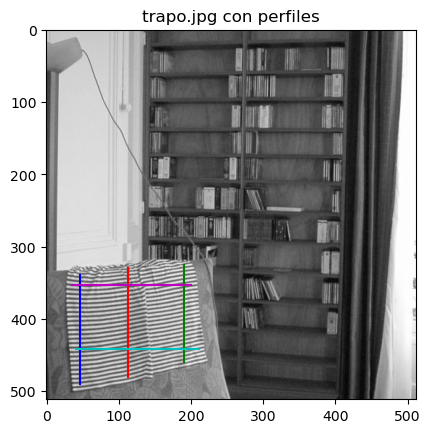

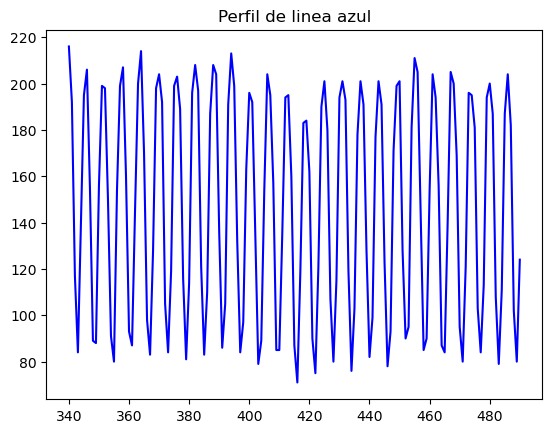

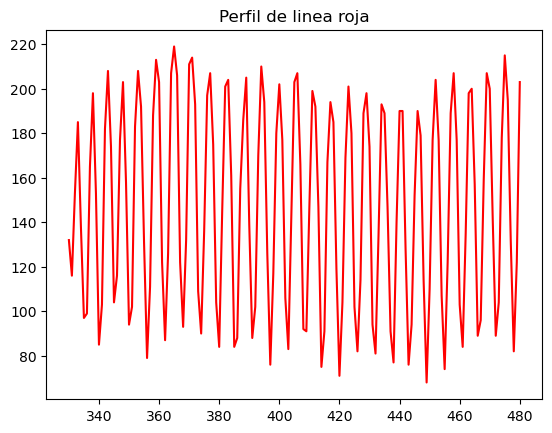

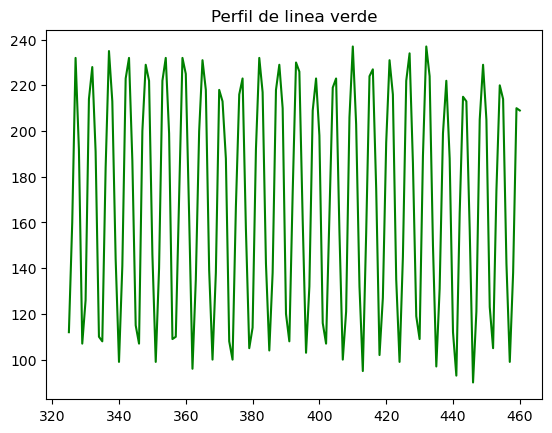

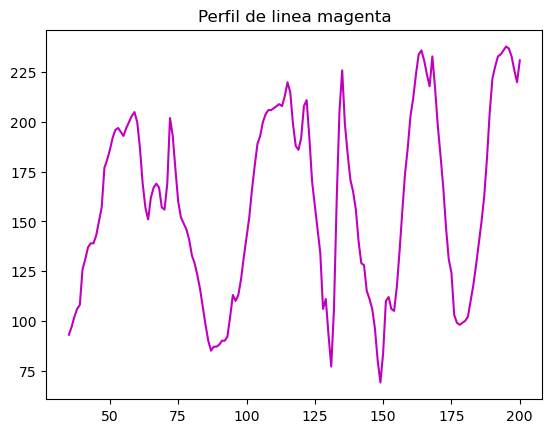

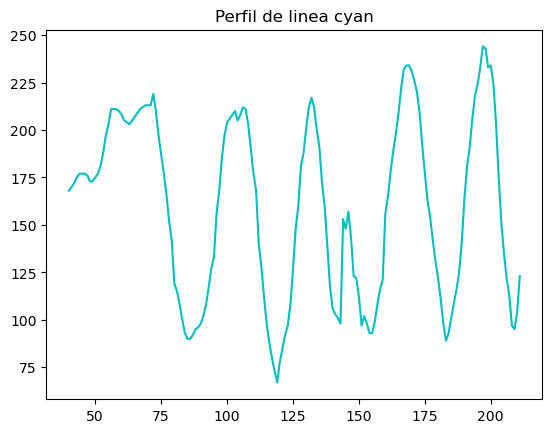

In [28]:
trapo= imread(dir_base_imagenes+'trapo.jpg')

plt.figure()
plt.imshow(trapo, cmap='gray')
plt.plot([46,46],[340,490], color='b')
plt.plot([113,113],[330,480], color='r')
plt.plot([190,190],[325,460], color='g')
plt.plot([35,200],[353,353], color='m')
plt.plot([40,211],[442,442], color='c')
plt.title('trapo.jpg con perfiles')

perfil_b=trapo[340:491,46]
plt.figure()
plt.plot(range(340,491), perfil_b, color='b')
plt.title('Perfil de linea azul')

perfil_r=trapo[330:481,113]
plt.figure()
plt.plot(range(330,481), perfil_r, color='r')
plt.title('Perfil de linea roja')

perfil_g=trapo[325:461,190]
plt.figure()
plt.plot(range(325,461), perfil_g, color='g')
plt.title('Perfil de linea verde')

perfil_m=trapo[353,35:201]
plt.figure()
plt.plot(range(35,201), perfil_m, color='m')
plt.title('Perfil de linea magenta')

perfil_c=trapo[442,40:212]
plt.figure()
plt.plot(range(40,212), perfil_c, color='c')
plt.title('Perfil de linea cyan')


Se midió en Fiji el período de la onda en ambas direcciones:  
-Período en perfiles verticales: 6p  
-Período en perfiles horizontales: 28p

**b)** Calcular la transformada de Fourier de la imagen y visualizar los picos espectrales. Indicar en qué frecuencias ocurren estos picos.

Text(0.5, 1.0, 'Transformada de Fourier de trapo.jpg')

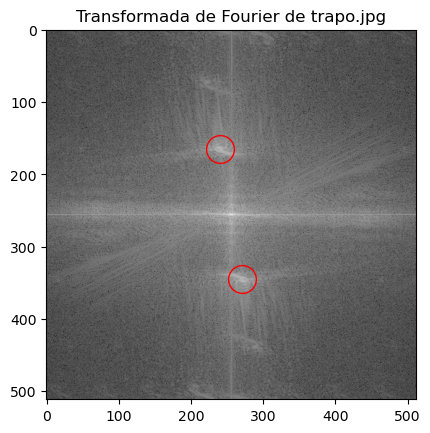

In [29]:
fft_trapo= np.log(np.abs(fftshift(fft2(trapo))))

plt.figure()
plt.imshow(fft_trapo, cmap='gray')
plt.plot(240, 165, marker="o", markersize=20, markeredgecolor="red", markerfacecolor="none")
plt.plot(270, 345, marker="o", markersize=20, markeredgecolor="red", markerfacecolor="none")
plt.title('Transformada de Fourier de trapo.jpg')





Los picos ocurren a aproximadamente un período de 5.5p

**c)** Discutir la relación entre las medidas realizadas en el espacio en **(a)** y la ubicación de los picos en frecuencia en **(b)**

Se pueden observar los picos espectrales marcados con circulos rojos, estos picos están orientados según el ángulo de las líneas del trapo, si se proyecta en los ejes vertical y horizontal se tiene que los picos ocurren a un período de aproximadamente 6p en la vertical y 28p en la horizontal, lo cual coincide con las mediciones realizadas anteriormente, estas mediciones fueron realizadas en Fiji pasando el cursor sobre los picos y los puntos proyectados.

## 6) Template matching

**a)** Diseñar un programa que detecte automáticamente cuántas veces aparece Wally en la imagen “dondeEstaWally.png”.  Se deberá implementar la comparación de al menos tres maneras diferentes:

* correlación espacial
* correlación usando la FFT
* correlación de fase ([phase correlation](https://en.wikipedia.org/wiki/Phase_correlation))

Para esa tarea se podrá usar la función **scipy.signal.convolve**. En caso de usar esta función o una similar, se explicarán los parámetros usados.


Se ha encontrado a Wally 7 veces utilizando correlación espacial. Tiempo: 7.2 s
Se ha encontrado a Wally 7 veces utilizando la FFT. Tiempo: 0.0 s
Se ha encontrado a Wally 7 veces utilizando correlación de fase. Tiempo: 0.0 s


Text(0.5, 1.0, 'Wallys detectados utilizando correlación de fase')

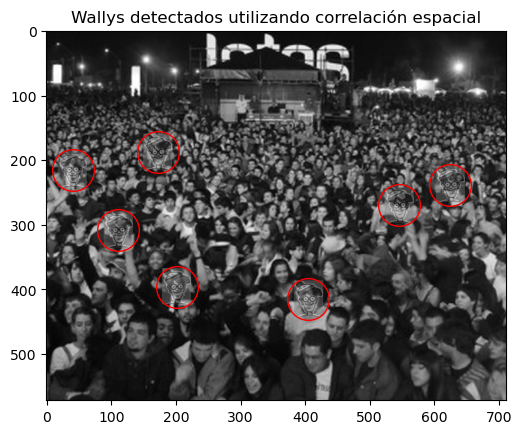

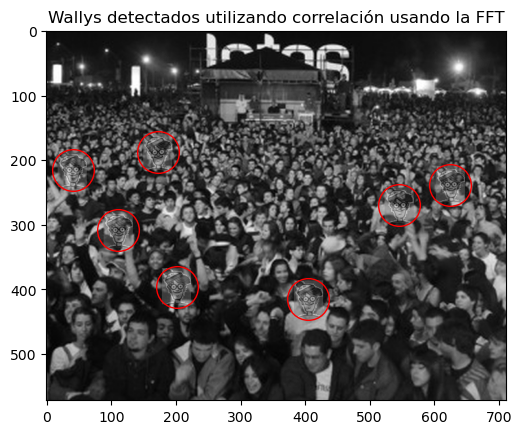

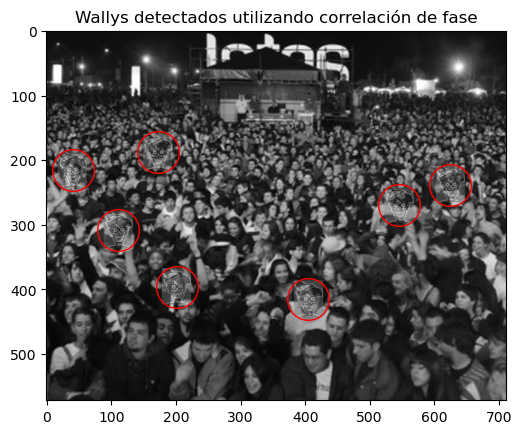

In [30]:
from scipy.signal import convolve
import time

Wally_template=imread('imagenes/Wally_template.png')
dondeEstaWally=imread('imagenes/dondeEstaWally.png')

# Se normalizan las imágenes para mejorar la precisión del método
template_norm = (Wally_template - np.mean(Wally_template)) / np.std(Wally_template)
dondeEstaWally_norm= (dondeEstaWally - np.mean(dondeEstaWally)) / np.std(dondeEstaWally)
template_fft=fft2(template_norm, shape=dondeEstaWally_norm.shape)
dondeEstaWally_fft=fft2(dondeEstaWally_norm)

inicio=time.time()
result_direct = convolve(dondeEstaWally_norm, template_norm[::-1,::-1], mode='valid', method='direct')
#mode='valid' es para que se muestre el resultado sin hacer padding, perdiendo las filas y columnas de los extremos de la imagen
#method='direct' indica que se hace la convolución normal, no por medio de la multiplicación en frecuencia 
result_direct = (result_direct-np.min(result_direct))/(np.max(result_direct)-np.min(result_direct)) #Se escalan entre 0 y 1
tiempo_direct=round(time.time()-inicio,1)
inicio=time.time()
result_fft = convolve(dondeEstaWally_norm, template_norm[::-1,::-1], mode='valid', method='fft')
#result_fft= ifft2(dondeEstaWally_fft*np.conj(template_fft)).real
result_fft = (result_fft-np.min(result_fft))/(np.max(result_fft)-np.min(result_fft)) #Se escalan entre 0 y 1
tiempo_fft = round(time.time()-inicio,1)
inicio=time.time()
result_phase= ifft2(dondeEstaWally_fft/np.abs(dondeEstaWally_fft)*np.conj(template_fft/np.abs(template_fft))).real
result_phase = (result_phase-np.min(result_phase))/(np.max(result_phase)-np.min(result_phase)) #Se escalan entre 0 y 1
tiempo_phase=round(time.time()-inicio,1)

#Se establecen los límites de correlación para cada método, de forma que el resultado se ajuste a lo esperado
threshold_direct=0.85
threshold_fft=0.85
threshold_phase=0.5

#Contar el número de apariciones
repeticiones_direct=np.sum(result_direct > threshold_direct)
repeticiones_fft=np.sum(result_fft > threshold_fft)
repeticiones_phase=np.sum(result_phase > threshold_phase)

#Hallar las coordenadas de las apariciones
coords_direct_y, coords_direct_x= np.where(result_direct >= threshold_direct)
coords_fft_y, coords_fft_x = np.where(result_fft >= threshold_fft)
coords_phase_y, coords_phase_x = np.where(result_phase >= threshold_phase)
print('Se ha encontrado a Wally '+str(repeticiones_direct)+' veces utilizando correlación espacial. Tiempo: '+str(tiempo_direct)+' s')
print('Se ha encontrado a Wally '+str(repeticiones_fft)+' veces utilizando la FFT. Tiempo: '+str(tiempo_fft)+' s')
print('Se ha encontrado a Wally '+str(repeticiones_phase)+' veces utilizando correlación de fase. Tiempo: '+str(tiempo_phase)+' s')

plt.figure()
plt.imshow(dondeEstaWally, cmap='gray')
plt.plot(coords_direct_x+Wally_template.shape[1]//2, coords_direct_y+Wally_template.shape[0]//2, marker='o', markersize=30, markeredgecolor="red", markerfacecolor="none", linestyle="none")
plt.title('Wallys detectados utilizando correlación espacial')

plt.figure()
plt.imshow(dondeEstaWally, cmap='gray')
plt.plot(coords_fft_x+Wally_template.shape[1]//2, coords_fft_y+Wally_template.shape[0]//2, marker='o', markersize=30, markeredgecolor="red", markerfacecolor="none", linestyle="none")
plt.title('Wallys detectados utilizando correlación usando la FFT')

plt.figure()
plt.imshow(dondeEstaWally, cmap='gray')
plt.plot(coords_phase_x+Wally_template.shape[1]//2, coords_phase_y+Wally_template.shape[0]//2, marker='o', markersize=30, markeredgecolor="red", markerfacecolor="none", linestyle="none")
plt.title('Wallys detectados utilizando correlación de fase')

**b)** Comparar los resultados y los tiempos insumidos por los distintos métodos

Se realizó como preprocesamiento de las imágenes una normalización, restandole la media y dividiendo por la desviación estándar. Esto se hizo teniendo en cuenta que los Wallys en la imagen no están exactamente como en el template, sino que están con cierta transparencia ubicados sobre distintos fondos. Esta normalización elimina los posibles sesgos generados por esta situación.  
  
Los métodos de correlación espacial y correlación usando la FFT, como es de esperar, dan los mismos resultados, con la diferencia que el primero demora mucho más tiempo en ejecutarse, esto se debe a que hace la convolución pasando el template por encima de la imagen, mientras que el otro hace la multiplicación en frecuencia. Los resultados de estos métodos se ajustan a la realidad luego de seleccionar el threshold adecuado. Se podría no depender tanto de la selección del threshold (pudiendo bajarlo más) aplicando una funcion que elimine los resultados que no son máximos locales (y por lo tanto los círculos se superponen).  

El método de correlación de fase da el resultado correcto, y al ser un método aplicado en frecuencia, su tiempo de ejecución es muy bajo. En este caso, se puede aplicar un threshold de 0.5 y aún así no aparecen falsos positivos. 
  

Los círculos de la representación de los resultados fueron graficados con su centro en los valores de correlación que están por encima del threshold.

































